In [1]:
%load_ext nb_black

<IPython.core.display.Javascript object>

# Categorizing Hiking Activities

### Background
This dataset was scraped from hikr.org, a website were you can log reports on your hiking trips.


Data source:https://www.kaggle.com/roccoli/gpx-hike-tracks


#### Research question
Can we cluster similar hikes using the data on the above site and how do our groups compare to the SAC scale (https://wiki.openstreetmap.org/wiki/Key:sac_scale)
a system for ranking the difficulty of hiking trails

The ratings from the above link are:
T1: Hiking
T2: Mountain hiking
T3: Demanding mountain_hiking
T4: Alpine hiking
T5: Demanding alpine hiking
T6: Difficult alpine hiking


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.metrics import silhouette_score, davies_bouldin_score

<IPython.core.display.Javascript object>

### Load Data

In [3]:
df = pd.read_csv("gpx-tracks-from-hikr.org.csv")

<IPython.core.display.Javascript object>

### Exploring the data

In [4]:
df.head()

,_id,length_3d,user,start_time,max_elevation,bounds,uphill,moving_time,end_time,max_speed,gpx,difficulty,min_elevation,url,downhill,name,length_2d
0,5afb229e8f80884aaad9c6ea,10832.953016,Bergfritz,2018-05-11 07:37:40,1934.47,"{'min': {'type': 'Point', 'coordinates': [13.2...",612.880,12155.0,2018-05-11 11:38:23,1.595493,"<?xml version=""1.0"" encoding=""UTF-8""?>\n<gpx x...",T2 - Mountain hike,1322.96,http://www.hikr.org/tour/post131855.html,609.670,"Remsteinkopf, 1945 m",10832.953016
1,5afb229e8f80884aaad9c6eb,12259.376315,Bergfritz,2018-05-12 07:25:08,2186.21,"{'min': {'type': 'Point', 'coordinates': [13.1...",614.753,13876.0,2018-05-12 12:08:28,1.394320,"<?xml version=""1.0"" encoding=""UTF-8""?>\n<gpx x...",T3 - Difficult Mountain hike,1266.40,http://www.hikr.org/tour/post131856.html,1193.733,"Schuhflicker, 2214 m",12259.376315
2,5afb229e8f80884aaad9c6ec,22980.168081,igor,2018-05-11 06:29:38,2265.00,"{'min': {'type': 'Point', 'coordinates': [8.99...",2255.976,28971.0,2018-05-11 15:32:43,1.503002,"<?xml version=""1.0"" encoding=""UTF-8""?>\n<gpx x...",T3 - Difficult Mountain hike,176.54,http://www.hikr.org/tour/post131839.html,2177.626,Cima d'erbea Est quota 2164m e Gaggio 2267m,22980.168081
3,5afb229e8f80884aaad9c6ed,24903.503470,rkroebl,2018-05-10 07:06:22,962.42,"{'min': {'type': 'Point', 'coordinates': [8.43...",882.312,26726.0,2018-05-10 16:15:18,1.516689,"<?xml version=""1.0"" encoding=""UTF-8""?>\n<gpx x...",T2 - Mountain hike,388.51,http://www.hikr.org/tour/post131840.html,901.052,Waldstätterweg: Alpnachstad - Buochs,24903.503470
4,5afb229e8f80884aaad9c6ee,19581.273819,rkroebl,2018-05-11 05:44:58,697.57,"{'min': {'type': 'Point', 'coordinates': [8.61...",310.662,18197.0,2018-05-11 12:54:25,1.542405,"<?xml version=""1.0"" encoding=""UTF-8""?>\n<gpx x...",T2 - Mountain hike,438.50,http://www.hikr.org/tour/post131845.html,305.372,Waldstätterweg: Buochs - Beckenried und Gersau...,19581.273819


<IPython.core.display.Javascript object>

In [5]:
df.shape

(12141, 17)

<IPython.core.display.Javascript object>

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12141 entries, 0 to 12140
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   _id            12141 non-null  object 
 1   length_3d      12141 non-null  float64
 2   user           12141 non-null  object 
 3   start_time     9897 non-null   object 
 4   max_elevation  10563 non-null  float64
 5   bounds         12141 non-null  object 
 6   uphill         12141 non-null  float64
 7   moving_time    12141 non-null  float64
 8   end_time       9897 non-null   object 
 9   max_speed      12141 non-null  float64
 10  gpx            12141 non-null  object 
 11  difficulty     12141 non-null  object 
 12  min_elevation  10563 non-null  float64
 13  url            12141 non-null  object 
 14  downhill       12141 non-null  float64
 15  name           12141 non-null  object 
 16  length_2d      12141 non-null  float64
dtypes: float64(8), object(9)
memory usage: 1.6+ MB


<IPython.core.display.Javascript object>

In [7]:
df.describe()

,length_3d,max_elevation,uphill,moving_time,max_speed,min_elevation,downhill,length_2d
count,1.214100e+04,10563.000000,12141.000000,12141.000000,12141.000000,10563.000000,12141.000000,1.214100e+04
mean,1.874771e+04,1934.281708,942.184362,12848.445268,1.746356,1003.331150,879.145539,1.874771e+04
std,4.093098e+05,784.968353,1065.498993,11599.792248,5.394065,813.001041,1028.618856,4.093098e+05
min,0.000000e+00,-1.000000,0.000000,0.000000,0.000000,-32768.000000,0.000000,0.000000e+00
25%,8.254129e+03,1382.275000,420.142000,5260.000000,1.078841,560.020000,256.519000,8.254129e+03
50%,1.200577e+04,1986.700000,882.000000,12990.000000,1.367020,960.090000,823.199002,1.200577e+04
75%,1.645813e+04,2498.455848,1301.005000,18514.000000,1.604181,1389.485000,1266.923000,1.645813e+04
max,3.189180e+07,5633.462891,35398.006781,189380.000000,192.768748,4180.000000,52379.200000,3.189180e+07


<IPython.core.display.Javascript object>

In [8]:
# Lets take a look at one of the gpx files included in the data
gpx0 = df.gpx[0]
gpx0

'<?xml version="1.0" encoding="UTF-8"?>\n<gpx xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance" xmlns="http://www.topografix.com/GPX/1/1" xsi:schemaLocation="http://www.topografix.com/GPX/1/1 http://www.topografix.com/GPX/1/1/gpx.xsd" version="1.1" creator="Wanderkarte 4.0.2">\n<metadata>\n<author>\n<link ></link></author>\n<copyright ></copyright>\n<link ></link></metadata>\n<trk>\n<name>remsteinkopf</name>\n<link ></link>\n<trkseg>\n<trkpt lat="47.231143" lon="13.227007">\n<ele>1322.96</ele>\n<time>2018-05-11T07:37:40Z</time>\n<link ></link></trkpt>\n<trkpt lat="47.230543" lon="13.227488">\n<ele>1330.89</ele>\n<time>2018-05-11T07:39:44Z</time>\n<link ></link></trkpt>\n<trkpt lat="47.230637" lon="13.22651">\n<ele>1344.41</ele>\n<time>2018-05-11T07:41:17Z</time>\n<link ></link></trkpt>\n<trkpt lat="47.231071" lon="13.225765">\n<ele>1350.43</ele>\n<time>2018-05-11T07:42:36Z</time>\n<link ></link></trkpt>\n<trkpt lat="47.231073" lon="13.225428">\n<ele>1350.18</ele>\n<time>2018-05-11T

<IPython.core.display.Javascript object>

The above gpx data is interesting but it's outside of the scope of this project so we will drop it

In [9]:
df.drop("gpx", axis=1, inplace=True)

<IPython.core.display.Javascript object>

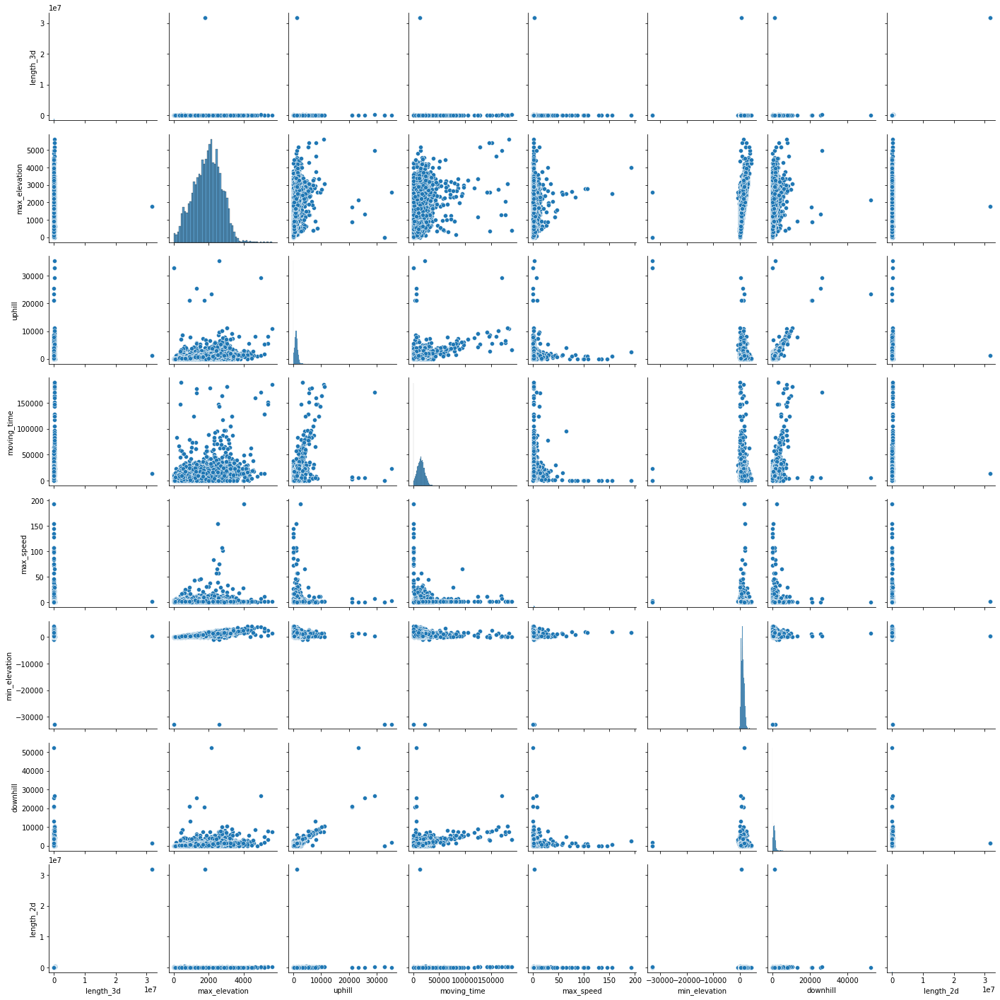

<IPython.core.display.Javascript object>

In [10]:
sns.pairplot(df)

### Data Cleaning

In [11]:
df.difficulty.unique()

array(['T2 - Mountain hike', 'T3 - Difficult Mountain hike',
       'T1 - Valley hike', 'T3+ - Difficult Mountain hike',
       'T4- - High-level Alpine hike', 'T4 - High-level Alpine hike',
       'T5- - Challenging High-level Alpine hike',
       'T5+ - Challenging High-level Alpine hike',
       'T4+ - High-level Alpine hike',
       'T6 - Difficult High-level Alpine hike',
       'T5 - Challenging High-level Alpine hike',
       'T6- - Difficult High-level Alpine hike',
       'T6+ - Difficult High-level Alpine hike'], dtype=object)

<IPython.core.display.Javascript object>

In [12]:
df.difficulty.value_counts()

T2 - Mountain hike                          3855
T3 - Difficult Mountain hike                2898
T3+ - Difficult Mountain hike               1225
T1 - Valley hike                            1142
T4 - High-level Alpine hike                  932
T5 - Challenging High-level Alpine hike      480
T4- - High-level Alpine hike                 470
T4+ - High-level Alpine hike                 422
T5- - Challenging High-level Alpine hike     226
T5+ - Challenging High-level Alpine hike     174
T6 - Difficult High-level Alpine hike        171
T6- - Difficult High-level Alpine hike       134
T6+ - Difficult High-level Alpine hike        12
Name: difficulty, dtype: int64

<IPython.core.display.Javascript object>

#### Simplify the difficulty column to just the T1 -T6 ratings

In [14]:
difficulty_short = ["T1", "T2", "T3", "T4", "T5", "T6"]
df["difficulty_combined"] = df.difficulty
for x in difficulty_short:
    df.difficulty_combined = df.difficulty_combined.mask(
        df.difficulty_combined.str.startswith(x), other=x
    )
df[["difficulty_combined", "difficulty"]]

,difficulty_combined,difficulty
0,T2,T2 - Mountain hike
1,T3,T3 - Difficult Mountain hike
2,T3,T3 - Difficult Mountain hike
3,T2,T2 - Mountain hike
4,T2,T2 - Mountain hike
...,...,...
12136,T3,T3 - Difficult Mountain hike
12137,T2,T2 - Mountain hike
12138,T1,T1 - Valley hike
12139,T1,T1 - Valley hike


<IPython.core.display.Javascript object>

In [15]:
df.difficulty_combined.value_counts()

T3    4123
T2    3855
T4    1824
T1    1142
T5     880
T6     317
Name: difficulty_combined, dtype: int64

<IPython.core.display.Javascript object>

#### Create an simpler category column from the difficulty column

In [16]:
category = ["Valley", "Mountain", "Alpine"]
df["category"] = df.difficulty
for x in category:
    df.category = df.category.mask(df.category.str.find(x) != -1, other=x)
df[["category", "difficulty"]]

,category,difficulty
0,Mountain,T2 - Mountain hike
1,Mountain,T3 - Difficult Mountain hike
2,Mountain,T3 - Difficult Mountain hike
3,Mountain,T2 - Mountain hike
4,Mountain,T2 - Mountain hike
...,...,...
12136,Mountain,T3 - Difficult Mountain hike
12137,Mountain,T2 - Mountain hike
12138,Valley,T1 - Valley hike
12139,Valley,T1 - Valley hike


<IPython.core.display.Javascript object>

In [17]:
df.category.value_counts()

Mountain    7978
Alpine      3021
Valley      1142
Name: category, dtype: int64

<IPython.core.display.Javascript object>

#### Check for missing values

In [18]:
df.isnull().sum() / df.isnull().count()

_id                    0.000000
length_3d              0.000000
user                   0.000000
start_time             0.184828
max_elevation          0.129973
bounds                 0.000000
uphill                 0.000000
moving_time            0.000000
end_time               0.184828
max_speed              0.000000
difficulty             0.000000
min_elevation          0.129973
url                    0.000000
downhill               0.000000
name                   0.000000
length_2d              0.000000
difficulty_combined    0.000000
category               0.000000
dtype: float64

<IPython.core.display.Javascript object>

In [19]:
# Drop rows with null values
df2 = df.dropna()


<IPython.core.display.Javascript object>

In [20]:
df2.isnull().sum()

_id                    0
length_3d              0
user                   0
start_time             0
max_elevation          0
bounds                 0
uphill                 0
moving_time            0
end_time               0
max_speed              0
difficulty             0
min_elevation          0
url                    0
downhill               0
name                   0
length_2d              0
difficulty_combined    0
category               0
dtype: int64

<IPython.core.display.Javascript object>

#### Clean up start time value errors

In [21]:
df2.sort_values(by="start_time").head(10)

,_id,length_3d,user,start_time,max_elevation,bounds,uphill,moving_time,end_time,max_speed,difficulty,min_elevation,url,downhill,name,length_2d,difficulty_combined,category
388,5afb22b78f80884aaad9c86e,422304.245534,hikemania,0001-01-01 00:00:00,624.001,"{'min': {'type': 'Point', 'coordinates': [12.3...",4607.6017,23288.0,2015-04-06 21:34:11,1.13013,T2 - Mountain hike,0.00,http://www.hikr.org/tour/post128750.html,4263.6007,Fränkischer Gebirgsweg als Trekkingtour,422304.245534,T2,Mountain
1378,5afb23058f80884aaad9cc4c,9712.442446,Bergfritz,1970-01-01 00:00:00,1898.380,"{'min': {'type': 'Point', 'coordinates': [12.8...",476.7980,0.0,1970-01-01 00:00:00,0.00000,T1 - Valley hike,1421.67,http://www.hikr.org/tour/post123223.html,480.3780,Apriach-Rundweg,9712.442446,T1,Valley
593,5afb22c48f80884aaad9c93b,5362.922073,Bergfritz,1970-01-01 00:00:00,1452.980,"{'min': {'type': 'Point', 'coordinates': [15.4...",671.7670,0.0,1970-01-01 00:00:00,0.00000,T1 - Valley hike,772.92,http://www.hikr.org/tour/post127343.html,677.7770,"Schöckl, 1442 m",5362.922073,T1,Valley
6076,5afb245b8f80884aaad9dea6,8392.748926,Bergfritz,1970-01-01 00:00:00,1458.090,"{'min': {'type': 'Point', 'coordinates': [15.4...",677.6890,0.0,1970-01-01 00:00:00,0.00000,T1 - Valley hike,779.91,http://www.hikr.org/tour/post117678.html,677.8190,"Schöckl, 1442 m",8392.748926,T1,Valley
477,5afb22be8f80884aaad9c8c7,7509.947712,Bergfritz,1970-01-01 00:00:00,1459.280,"{'min': {'type': 'Point', 'coordinates': [15.4...",687.3070,0.0,1970-01-01 00:00:00,0.00000,T1 - Valley hike,765.43,http://www.hikr.org/tour/post128200.html,686.8270,"Schöckl, 1442 m",7509.947712,T1,Valley
3326,5afb23978f80884aaad9d3e8,13582.380585,Bergfritz,1970-01-01 00:00:00,2159.770,"{'min': {'type': 'Point', 'coordinates': [13.2...",915.4310,0.0,1970-01-01 00:00:00,0.00000,T2 - Mountain hike,1333.64,http://www.hikr.org/tour/post110719.html,916.3410,"Gründegg, 2168 m",13582.380585,T2,Mountain
8030,5afb24ee8f80884aaad9e648,10607.796407,Bergfritz,1970-01-01 00:00:00,1798.060,"{'min': {'type': 'Point', 'coordinates': [13.2...",935.9710,0.0,1970-01-01 00:00:00,0.00000,T2 - Mountain hike,889.31,http://www.hikr.org/tour/post105885.html,935.9410,"Saukaralm, 1850 m",10607.796407,T2,Mountain
2603,5afb235f8f80884aaad9d115,7284.451855,Bergfritz,1970-01-01 00:00:00,1655.400,"{'min': {'type': 'Point', 'coordinates': [15.0...",212.1410,0.0,1970-01-01 00:00:00,0.00000,T1 - Valley hike,1442.27,http://www.hikr.org/tour/post114954.html,218.6610,"Grünangerhütte, 1590 m",7284.451855,T1,Valley
1395,5afb23058f80884aaad9cc5d,7268.223241,Bergfritz,1970-01-01 00:00:00,1565.970,"{'min': {'type': 'Point', 'coordinates': [12.8...",314.3450,0.0,1970-01-01 00:00:00,0.00000,T2 - Mountain hike,1259.76,http://www.hikr.org/tour/post123209.html,316.8350,Haritzersteig,7268.223241,T2,Mountain
8031,5afb24ee8f80884aaad9e649,10282.945303,Bergfritz,1970-01-01 00:00:00,1542.470,"{'min': {'type': 'Point', 'coordinates': [13.2...",680.6640,0.0,1970-01-01 00:00:00,0.00000,T2 - Mountain hike,879.00,http://www.hikr.org/tour/post105886.html,682.8640,"Aubauer-Heimalm, 1539 m",10282.945303,T2,Mountain


<IPython.core.display.Javascript object>

In [22]:
df2.loc[lambda x: x.start_time == "1970-01-01 00:00:00"].shape

(26, 18)

<IPython.core.display.Javascript object>

In [23]:
df3 = df2.loc[lambda x: x.start_time != "1970-01-01 00:00:00"].copy()

<IPython.core.display.Javascript object>

In [24]:
df3 = df3.loc[lambda x: x.start_time != "1970-01-01 01:00:00"].copy()

<IPython.core.display.Javascript object>

In [25]:
df3 = df3.loc[lambda x: x.start_time != "0001-01-01 00:00:00"].copy()

<IPython.core.display.Javascript object>

#### Clean up max_speed errors

In [26]:
df3.sort_values(by="max_speed").head(10)

,_id,length_3d,user,start_time,max_elevation,bounds,uphill,moving_time,end_time,max_speed,difficulty,min_elevation,url,downhill,name,length_2d,difficulty_combined,category
3288,5afb23948f80884aaad9d3c2,957.524571,SCM,2016-07-18 00:26:44,1466.000000,"{'min': {'type': 'Point', 'coordinates': [-109...",24.900000,1048.0,2016-07-18 00:52:25,0.0,T1 - Valley hike,1439.000000,http://www.hikr.org/tour/post109644.html,24.900000,Island in the Sky im Canyonlands National Park,957.524571,T1,Valley
5746,5afb24458f80884aaad9dd5c,927.643405,D!nu,2017-01-08 11:50:13,586.080000,"{'min': {'type': 'Point', 'coordinates': [8.19...",13.984000,743.0,2017-01-08 12:11:58,0.0,T1 - Valley hike,538.070000,http://www.hikr.org/tour/post94108.html,48.534000,Neuenkirch und Umgebung,927.643405,T1,Valley
5892,5afb244e8f80884aaad9ddee,980.504030,Sky,2015-04-18 14:26:01,908.400000,"{'min': {'type': 'Point', 'coordinates': [9.89...",480.200000,1432.0,2015-04-18 14:49:53,0.0,T2 - Mountain hike,428.200000,http://www.hikr.org/tour/post93222.html,0.000000,Valtellina Vertical Tube Race,980.504030,T2,Mountain
9283,5afb25438f80884aaad9eb2d,6386.934125,Simone86,2015-07-18 05:31:08,2526.589951,"{'min': {'type': 'Point', 'coordinates': [8.16...",1212.892870,8754.0,2015-07-18 09:58:46,0.0,T3+ - Difficult Mountain hike,1317.120049,http://www.hikr.org/tour/post96724.html,17.822993,Pizzo Valgrande di Vallè (2.529m),6386.934125,T3,Mountain
8477,5afb25098f80884aaad9e807,3648.147158,Alberto,2015-11-15 16:03:41,1948.250000,"{'min': {'type': 'Point', 'coordinates': [8.82...",1044.470000,0.0,2015-11-15 13:08:26,0.0,T3 - Difficult Mountain hike,903.780000,http://www.hikr.org/tour/post102086.html,0.000000,Rifugio Costa m.1941 (CH): un'insolita giornat...,3648.147158,T3,Mountain
11231,5afb25d58f80884aaad9f2c9,10989.844288,Giaco,2014-06-21 11:59:06,2405.480000,"{'min': {'type': 'Point', 'coordinates': [9.38...",1085.659000,0.0,2014-06-21 06:18:32,0.0,T3+ - Difficult Mountain hike,1422.260000,http://www.hikr.org/tour/post81857.html,1082.539000,Grigna Settentrionale,10989.844288,T3,Mountain
9248,5afb25418f80884aaad9eb0a,4.194346,DutchHikr,2015-01-04 09:21:40,-1.000000,"{'min': {'type': 'Point', 'coordinates': [4.39...",0.000000,0.0,2015-01-04 10:05:28,0.0,T1 - Valley hike,-1.000000,http://www.hikr.org/tour/post97208.html,0.000000,"Durch ehemalige ""Bollenvelden'",4.194346,T1,Valley
6002,5afb24578f80884aaad9de5c,462.146938,quacamozza,2015-03-17 06:49:24,919.890000,"{'min': {'type': 'Point', 'coordinates': [10.5...",0.000000,239.0,2015-03-17 06:53:23,0.0,T3 - Difficult Mountain hike,887.200000,http://www.hikr.org/tour/post92191.html,32.690000,Alpspitze und Edelsberg,462.146938,T3,Mountain
10477,5afb259d8f80884aaad9efd7,21814.501772,Francesco,2014-10-19 15:33:59,2360.170000,"{'min': {'type': 'Point', 'coordinates': [8.74...",1671.720000,0.0,2014-10-18 08:07:03,0.0,T4+ - High-level Alpine hike,646.140000,http://www.hikr.org/tour/post87149.html,2657.210000,"""Traversata"": dalla valle Maggia - con Pizzo d...",21814.501772,T4,Alpine
6193,5afb24638f80884aaad9df1b,21212.908809,NrcSlv,2009-02-15 09:40:14,706.706299,"{'min': {'type': 'Point', 'coordinates': [9.54...",785.865794,1284.0,2016-12-22 14:22:54,0.0,T1 - Valley hike,250.080200,http://www.hikr.org/tour/post116367.html,803.701844,Monte Canto - Giro del Crinale,21212.908809,T1,Valley


<IPython.core.display.Javascript object>

In [27]:
df3 = df3.loc[lambda x: x.max_speed > 0].copy()
df3

,_id,length_3d,user,start_time,max_elevation,bounds,uphill,moving_time,end_time,max_speed,difficulty,min_elevation,url,downhill,name,length_2d,difficulty_combined,category
0,5afb229e8f80884aaad9c6ea,10832.953016,Bergfritz,2018-05-11 07:37:40,1934.470000,"{'min': {'type': 'Point', 'coordinates': [13.2...",612.880000,12155.0,2018-05-11 11:38:23,1.595493,T2 - Mountain hike,1322.960000,http://www.hikr.org/tour/post131855.html,609.670000,"Remsteinkopf, 1945 m",10832.953016,T2,Mountain
1,5afb229e8f80884aaad9c6eb,12259.376315,Bergfritz,2018-05-12 07:25:08,2186.210000,"{'min': {'type': 'Point', 'coordinates': [13.1...",614.753000,13876.0,2018-05-12 12:08:28,1.394320,T3 - Difficult Mountain hike,1266.400000,http://www.hikr.org/tour/post131856.html,1193.733000,"Schuhflicker, 2214 m",12259.376315,T3,Mountain
2,5afb229e8f80884aaad9c6ec,22980.168081,igor,2018-05-11 06:29:38,2265.000000,"{'min': {'type': 'Point', 'coordinates': [8.99...",2255.976000,28971.0,2018-05-11 15:32:43,1.503002,T3 - Difficult Mountain hike,176.540000,http://www.hikr.org/tour/post131839.html,2177.626000,Cima d'erbea Est quota 2164m e Gaggio 2267m,22980.168081,T3,Mountain
3,5afb229e8f80884aaad9c6ed,24903.503470,rkroebl,2018-05-10 07:06:22,962.420000,"{'min': {'type': 'Point', 'coordinates': [8.43...",882.312000,26726.0,2018-05-10 16:15:18,1.516689,T2 - Mountain hike,388.510000,http://www.hikr.org/tour/post131840.html,901.052000,Waldstätterweg: Alpnachstad - Buochs,24903.503470,T2,Mountain
4,5afb229e8f80884aaad9c6ee,19581.273819,rkroebl,2018-05-11 05:44:58,697.570000,"{'min': {'type': 'Point', 'coordinates': [8.61...",310.662000,18197.0,2018-05-11 12:54:25,1.542405,T2 - Mountain hike,438.500000,http://www.hikr.org/tour/post131845.html,305.372000,Waldstätterweg: Buochs - Beckenried und Gersau...,19581.273819,T2,Mountain
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12136,5afb26108f80884aaad9f652,3882.088056,guenter,2013-09-14 10:33:16,1603.135742,"{'min': {'type': 'Point', 'coordinates': [15.5...",672.730664,4306.0,2013-09-14 12:53:09,1.271990,T3 - Difficult Mountain hike,936.461426,http://www.hikr.org/tour/post70727.html,7.498242,Hohes Waxenegg,3882.088056,T3,Mountain
12137,5afb26108f80884aaad9f653,13144.015870,Bergfritz,2013-09-14 05:29:24,1664.660000,"{'min': {'type': 'Point', 'coordinates': [15.2...",928.770000,14660.0,2013-09-14 09:57:36,1.727332,T2 - Mountain hike,826.870000,http://www.hikr.org/tour/post70731.html,925.880000,"Mugel 1630 m , Roßeck 1664 m",13144.015870,T2,Mountain
12138,5afb26108f80884aaad9f654,8865.050380,mountainrescue,2013-09-15 06:43:39,1658.300000,"{'min': {'type': 'Point', 'coordinates': [15.2...",821.240000,8239.0,2013-09-15 09:21:43,2.106299,T1 - Valley hike,882.600000,http://www.hikr.org/tour/post70744.html,839.040000,Man soll sich nie auf die Meteofuzzis verlasse...,8865.050380,T1,Valley
12139,5afb26108f80884aaad9f655,17047.654835,Curi,2013-09-07 08:19:07,646.620000,"{'min': {'type': 'Point', 'coordinates': [11.6...",307.855000,18354.0,2013-09-07 15:11:42,1.425461,T1 - Valley hike,425.040000,http://www.hikr.org/tour/post70500.html,289.595000,"Frankenwald: Der ""Mühlenweg""",17047.654835,T1,Valley


<IPython.core.display.Javascript object>

In [28]:
# Speeds are in meters/sec
# 5 meters/sec is over 11 miles an hour, a fast run. We will remove speed values
# higher than that threshold
df3 = df3.loc[lambda x: x.max_speed <= 5].copy()
df3

,_id,length_3d,user,start_time,max_elevation,bounds,uphill,moving_time,end_time,max_speed,difficulty,min_elevation,url,downhill,name,length_2d,difficulty_combined,category
0,5afb229e8f80884aaad9c6ea,10832.953016,Bergfritz,2018-05-11 07:37:40,1934.470000,"{'min': {'type': 'Point', 'coordinates': [13.2...",612.880000,12155.0,2018-05-11 11:38:23,1.595493,T2 - Mountain hike,1322.960000,http://www.hikr.org/tour/post131855.html,609.670000,"Remsteinkopf, 1945 m",10832.953016,T2,Mountain
1,5afb229e8f80884aaad9c6eb,12259.376315,Bergfritz,2018-05-12 07:25:08,2186.210000,"{'min': {'type': 'Point', 'coordinates': [13.1...",614.753000,13876.0,2018-05-12 12:08:28,1.394320,T3 - Difficult Mountain hike,1266.400000,http://www.hikr.org/tour/post131856.html,1193.733000,"Schuhflicker, 2214 m",12259.376315,T3,Mountain
2,5afb229e8f80884aaad9c6ec,22980.168081,igor,2018-05-11 06:29:38,2265.000000,"{'min': {'type': 'Point', 'coordinates': [8.99...",2255.976000,28971.0,2018-05-11 15:32:43,1.503002,T3 - Difficult Mountain hike,176.540000,http://www.hikr.org/tour/post131839.html,2177.626000,Cima d'erbea Est quota 2164m e Gaggio 2267m,22980.168081,T3,Mountain
3,5afb229e8f80884aaad9c6ed,24903.503470,rkroebl,2018-05-10 07:06:22,962.420000,"{'min': {'type': 'Point', 'coordinates': [8.43...",882.312000,26726.0,2018-05-10 16:15:18,1.516689,T2 - Mountain hike,388.510000,http://www.hikr.org/tour/post131840.html,901.052000,Waldstätterweg: Alpnachstad - Buochs,24903.503470,T2,Mountain
4,5afb229e8f80884aaad9c6ee,19581.273819,rkroebl,2018-05-11 05:44:58,697.570000,"{'min': {'type': 'Point', 'coordinates': [8.61...",310.662000,18197.0,2018-05-11 12:54:25,1.542405,T2 - Mountain hike,438.500000,http://www.hikr.org/tour/post131845.html,305.372000,Waldstätterweg: Buochs - Beckenried und Gersau...,19581.273819,T2,Mountain
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12136,5afb26108f80884aaad9f652,3882.088056,guenter,2013-09-14 10:33:16,1603.135742,"{'min': {'type': 'Point', 'coordinates': [15.5...",672.730664,4306.0,2013-09-14 12:53:09,1.271990,T3 - Difficult Mountain hike,936.461426,http://www.hikr.org/tour/post70727.html,7.498242,Hohes Waxenegg,3882.088056,T3,Mountain
12137,5afb26108f80884aaad9f653,13144.015870,Bergfritz,2013-09-14 05:29:24,1664.660000,"{'min': {'type': 'Point', 'coordinates': [15.2...",928.770000,14660.0,2013-09-14 09:57:36,1.727332,T2 - Mountain hike,826.870000,http://www.hikr.org/tour/post70731.html,925.880000,"Mugel 1630 m , Roßeck 1664 m",13144.015870,T2,Mountain
12138,5afb26108f80884aaad9f654,8865.050380,mountainrescue,2013-09-15 06:43:39,1658.300000,"{'min': {'type': 'Point', 'coordinates': [15.2...",821.240000,8239.0,2013-09-15 09:21:43,2.106299,T1 - Valley hike,882.600000,http://www.hikr.org/tour/post70744.html,839.040000,Man soll sich nie auf die Meteofuzzis verlasse...,8865.050380,T1,Valley
12139,5afb26108f80884aaad9f655,17047.654835,Curi,2013-09-07 08:19:07,646.620000,"{'min': {'type': 'Point', 'coordinates': [11.6...",307.855000,18354.0,2013-09-07 15:11:42,1.425461,T1 - Valley hike,425.040000,http://www.hikr.org/tour/post70500.html,289.595000,"Frankenwald: Der ""Mühlenweg""",17047.654835,T1,Valley


<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='max_speed'>

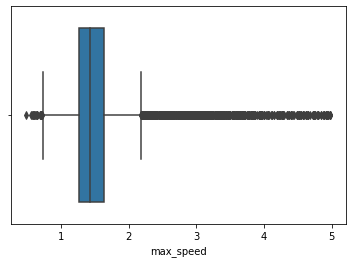

<IPython.core.display.Javascript object>

In [29]:
sns.boxplot(x=df3.max_speed)

#### Clean up elevation errors

<AxesSubplot:xlabel='min_elevation'>

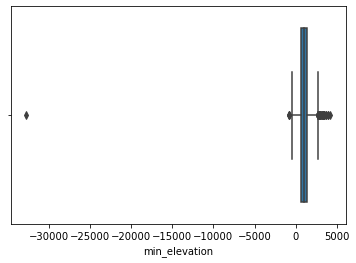

<IPython.core.display.Javascript object>

In [30]:
sns.boxplot(x=df3.min_elevation)

In [31]:
# -30000 meters looks like an obvious error so we will remove it along with
# other rows with negative elevation values
df3 = df3.loc[lambda x: x.min_elevation >= 0].copy()
df3

,_id,length_3d,user,start_time,max_elevation,bounds,uphill,moving_time,end_time,max_speed,difficulty,min_elevation,url,downhill,name,length_2d,difficulty_combined,category
0,5afb229e8f80884aaad9c6ea,10832.953016,Bergfritz,2018-05-11 07:37:40,1934.470000,"{'min': {'type': 'Point', 'coordinates': [13.2...",612.880000,12155.0,2018-05-11 11:38:23,1.595493,T2 - Mountain hike,1322.960000,http://www.hikr.org/tour/post131855.html,609.670000,"Remsteinkopf, 1945 m",10832.953016,T2,Mountain
1,5afb229e8f80884aaad9c6eb,12259.376315,Bergfritz,2018-05-12 07:25:08,2186.210000,"{'min': {'type': 'Point', 'coordinates': [13.1...",614.753000,13876.0,2018-05-12 12:08:28,1.394320,T3 - Difficult Mountain hike,1266.400000,http://www.hikr.org/tour/post131856.html,1193.733000,"Schuhflicker, 2214 m",12259.376315,T3,Mountain
2,5afb229e8f80884aaad9c6ec,22980.168081,igor,2018-05-11 06:29:38,2265.000000,"{'min': {'type': 'Point', 'coordinates': [8.99...",2255.976000,28971.0,2018-05-11 15:32:43,1.503002,T3 - Difficult Mountain hike,176.540000,http://www.hikr.org/tour/post131839.html,2177.626000,Cima d'erbea Est quota 2164m e Gaggio 2267m,22980.168081,T3,Mountain
3,5afb229e8f80884aaad9c6ed,24903.503470,rkroebl,2018-05-10 07:06:22,962.420000,"{'min': {'type': 'Point', 'coordinates': [8.43...",882.312000,26726.0,2018-05-10 16:15:18,1.516689,T2 - Mountain hike,388.510000,http://www.hikr.org/tour/post131840.html,901.052000,Waldstätterweg: Alpnachstad - Buochs,24903.503470,T2,Mountain
4,5afb229e8f80884aaad9c6ee,19581.273819,rkroebl,2018-05-11 05:44:58,697.570000,"{'min': {'type': 'Point', 'coordinates': [8.61...",310.662000,18197.0,2018-05-11 12:54:25,1.542405,T2 - Mountain hike,438.500000,http://www.hikr.org/tour/post131845.html,305.372000,Waldstätterweg: Buochs - Beckenried und Gersau...,19581.273819,T2,Mountain
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12136,5afb26108f80884aaad9f652,3882.088056,guenter,2013-09-14 10:33:16,1603.135742,"{'min': {'type': 'Point', 'coordinates': [15.5...",672.730664,4306.0,2013-09-14 12:53:09,1.271990,T3 - Difficult Mountain hike,936.461426,http://www.hikr.org/tour/post70727.html,7.498242,Hohes Waxenegg,3882.088056,T3,Mountain
12137,5afb26108f80884aaad9f653,13144.015870,Bergfritz,2013-09-14 05:29:24,1664.660000,"{'min': {'type': 'Point', 'coordinates': [15.2...",928.770000,14660.0,2013-09-14 09:57:36,1.727332,T2 - Mountain hike,826.870000,http://www.hikr.org/tour/post70731.html,925.880000,"Mugel 1630 m , Roßeck 1664 m",13144.015870,T2,Mountain
12138,5afb26108f80884aaad9f654,8865.050380,mountainrescue,2013-09-15 06:43:39,1658.300000,"{'min': {'type': 'Point', 'coordinates': [15.2...",821.240000,8239.0,2013-09-15 09:21:43,2.106299,T1 - Valley hike,882.600000,http://www.hikr.org/tour/post70744.html,839.040000,Man soll sich nie auf die Meteofuzzis verlasse...,8865.050380,T1,Valley
12139,5afb26108f80884aaad9f655,17047.654835,Curi,2013-09-07 08:19:07,646.620000,"{'min': {'type': 'Point', 'coordinates': [11.6...",307.855000,18354.0,2013-09-07 15:11:42,1.425461,T1 - Valley hike,425.040000,http://www.hikr.org/tour/post70500.html,289.595000,"Frankenwald: Der ""Mühlenweg""",17047.654835,T1,Valley


<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='min_elevation'>

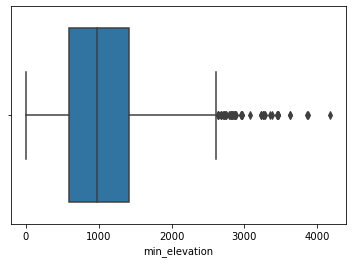

<IPython.core.display.Javascript object>

In [32]:
sns.boxplot(x=df3.min_elevation)

<AxesSubplot:xlabel='max_elevation'>

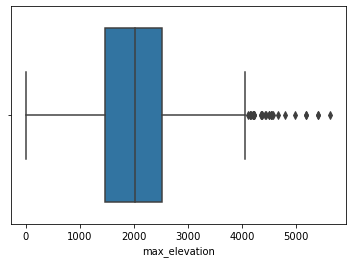

<IPython.core.display.Javascript object>

In [33]:
sns.boxplot(x=df3.max_elevation)

#### Clean up distance errors

<AxesSubplot:xlabel='length_2d'>

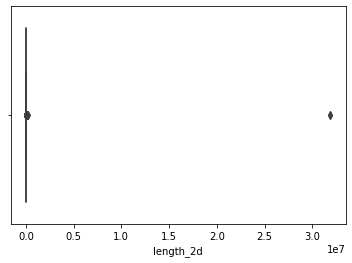

<IPython.core.display.Javascript object>

In [34]:
sns.boxplot(x=df3.length_2d)

In [35]:
df3 = df3.loc[lambda x: x.length_2d < 500000].copy()
df3

,_id,length_3d,user,start_time,max_elevation,bounds,uphill,moving_time,end_time,max_speed,difficulty,min_elevation,url,downhill,name,length_2d,difficulty_combined,category
0,5afb229e8f80884aaad9c6ea,10832.953016,Bergfritz,2018-05-11 07:37:40,1934.470000,"{'min': {'type': 'Point', 'coordinates': [13.2...",612.880000,12155.0,2018-05-11 11:38:23,1.595493,T2 - Mountain hike,1322.960000,http://www.hikr.org/tour/post131855.html,609.670000,"Remsteinkopf, 1945 m",10832.953016,T2,Mountain
1,5afb229e8f80884aaad9c6eb,12259.376315,Bergfritz,2018-05-12 07:25:08,2186.210000,"{'min': {'type': 'Point', 'coordinates': [13.1...",614.753000,13876.0,2018-05-12 12:08:28,1.394320,T3 - Difficult Mountain hike,1266.400000,http://www.hikr.org/tour/post131856.html,1193.733000,"Schuhflicker, 2214 m",12259.376315,T3,Mountain
2,5afb229e8f80884aaad9c6ec,22980.168081,igor,2018-05-11 06:29:38,2265.000000,"{'min': {'type': 'Point', 'coordinates': [8.99...",2255.976000,28971.0,2018-05-11 15:32:43,1.503002,T3 - Difficult Mountain hike,176.540000,http://www.hikr.org/tour/post131839.html,2177.626000,Cima d'erbea Est quota 2164m e Gaggio 2267m,22980.168081,T3,Mountain
3,5afb229e8f80884aaad9c6ed,24903.503470,rkroebl,2018-05-10 07:06:22,962.420000,"{'min': {'type': 'Point', 'coordinates': [8.43...",882.312000,26726.0,2018-05-10 16:15:18,1.516689,T2 - Mountain hike,388.510000,http://www.hikr.org/tour/post131840.html,901.052000,Waldstätterweg: Alpnachstad - Buochs,24903.503470,T2,Mountain
4,5afb229e8f80884aaad9c6ee,19581.273819,rkroebl,2018-05-11 05:44:58,697.570000,"{'min': {'type': 'Point', 'coordinates': [8.61...",310.662000,18197.0,2018-05-11 12:54:25,1.542405,T2 - Mountain hike,438.500000,http://www.hikr.org/tour/post131845.html,305.372000,Waldstätterweg: Buochs - Beckenried und Gersau...,19581.273819,T2,Mountain
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12136,5afb26108f80884aaad9f652,3882.088056,guenter,2013-09-14 10:33:16,1603.135742,"{'min': {'type': 'Point', 'coordinates': [15.5...",672.730664,4306.0,2013-09-14 12:53:09,1.271990,T3 - Difficult Mountain hike,936.461426,http://www.hikr.org/tour/post70727.html,7.498242,Hohes Waxenegg,3882.088056,T3,Mountain
12137,5afb26108f80884aaad9f653,13144.015870,Bergfritz,2013-09-14 05:29:24,1664.660000,"{'min': {'type': 'Point', 'coordinates': [15.2...",928.770000,14660.0,2013-09-14 09:57:36,1.727332,T2 - Mountain hike,826.870000,http://www.hikr.org/tour/post70731.html,925.880000,"Mugel 1630 m , Roßeck 1664 m",13144.015870,T2,Mountain
12138,5afb26108f80884aaad9f654,8865.050380,mountainrescue,2013-09-15 06:43:39,1658.300000,"{'min': {'type': 'Point', 'coordinates': [15.2...",821.240000,8239.0,2013-09-15 09:21:43,2.106299,T1 - Valley hike,882.600000,http://www.hikr.org/tour/post70744.html,839.040000,Man soll sich nie auf die Meteofuzzis verlasse...,8865.050380,T1,Valley
12139,5afb26108f80884aaad9f655,17047.654835,Curi,2013-09-07 08:19:07,646.620000,"{'min': {'type': 'Point', 'coordinates': [11.6...",307.855000,18354.0,2013-09-07 15:11:42,1.425461,T1 - Valley hike,425.040000,http://www.hikr.org/tour/post70500.html,289.595000,"Frankenwald: Der ""Mühlenweg""",17047.654835,T1,Valley


<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='length_2d'>

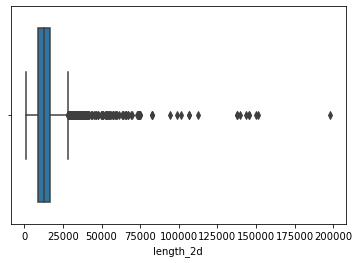

<IPython.core.display.Javascript object>

In [36]:
# After removing distance errors the longest distance is about 200km, this is a long hike
# but still possible
sns.boxplot(x=df3.length_2d)

#### Remove highly correlated features

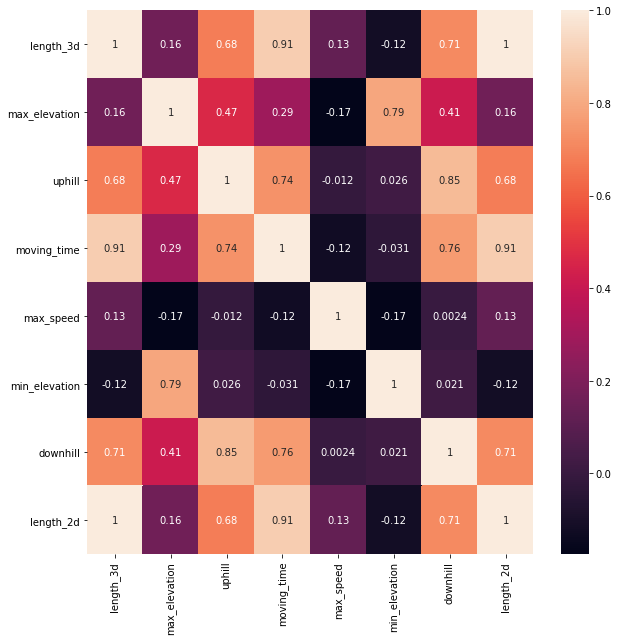

<IPython.core.display.Javascript object>

In [37]:
plt.figure(figsize=(10, 10))
sns.heatmap(df3.corr(), annot=True)
plt.show()

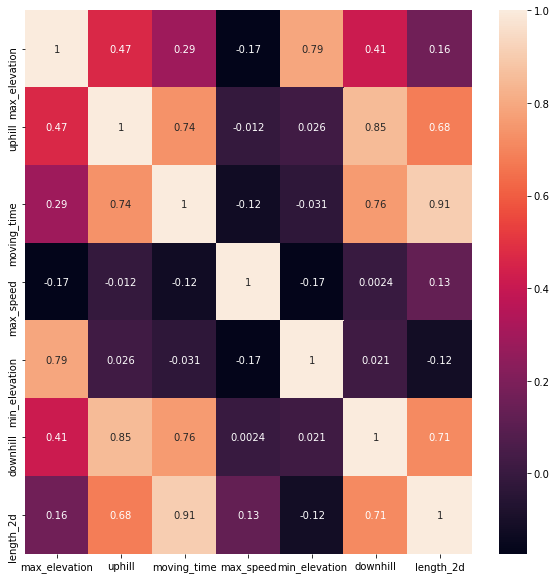

<IPython.core.display.Javascript object>

In [38]:
# The length_3d column shows 100% correlation with length_2d so we will drop it
df3.drop("length_3d", axis=1, inplace=True)
plt.figure(figsize=(10, 10))
sns.heatmap(df3.corr(), annot=True)
plt.show()

### Feature engineering

#### Create new time features and elevation features

The different time features (moving_time, uphill and downhill) show a high amount of correlation so lets try to create some new features out of them.

Max and min elevation are also highly correlated so we will combine them by taking the difference.

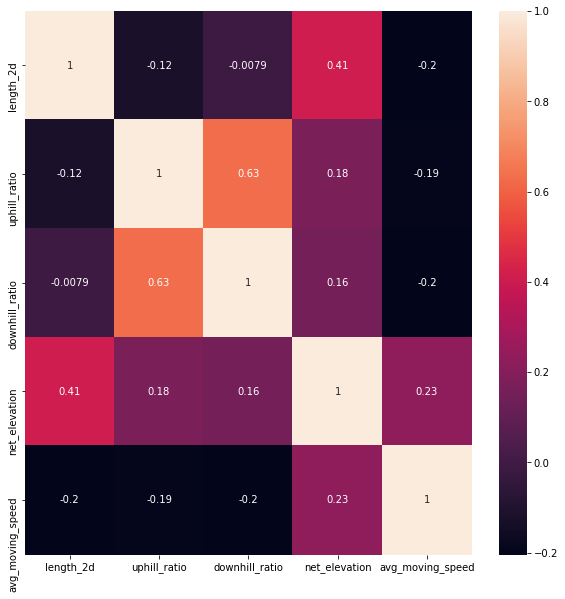

<IPython.core.display.Javascript object>

In [39]:
df3["uphill_ratio"] = df3.uphill / df3.moving_time
df3["downhill_ratio"] = df3.downhill / df3.moving_time
df3["net_elevation"] = df3.max_elevation - df3.min_elevation
df3["avg_moving_speed"] = df3.moving_time / df3.length_2d
plt.figure(figsize=(10, 10))
sns.heatmap(
    df3.drop(
        columns=[
            "uphill",
            "downhill",
            "max_elevation",
            "min_elevation",
            "moving_time",
            "max_speed",
        ]
    ).corr(),
    annot=True,
)
plt.show()

#### Create a length feature from the bounds column

In [40]:
import json

test = df3.bounds[0]
test = test.replace("'", '"')

<IPython.core.display.Javascript object>

In [41]:
json_test = json.loads(test)
json_test

{'min': {'type': 'Point', 'coordinates': [13.242523, 47.231143]},
 'max': {'type': 'Point', 'coordinates': [13.214401, 47.211109]}}

<IPython.core.display.Javascript object>

In [42]:
(
    json_test["min"]["coordinates"][1],
    json_test["min"]["coordinates"][0],
)

(47.231143, 13.242523)

<IPython.core.display.Javascript object>

In [43]:
json_test["max"]["coordinates"]

[13.214401, 47.211109]

<IPython.core.display.Javascript object>

In [44]:
from haversine import haversine, Unit

<IPython.core.display.Javascript object>

In [45]:
haversine(
    (
        json_test["min"]["coordinates"][1],
        json_test["min"]["coordinates"][0],
    ),
    (
        json_test["max"]["coordinates"][1],
        json_test["max"]["coordinates"][0],
    ),
    unit=Unit.METERS,
)

3077.8294917301127

<IPython.core.display.Javascript object>

In [46]:
def convert_bounds_to_length(bounds):
    x = bounds.replace("'", '"')
    x_dict = json.loads(x)
    return haversine(
        (
            x_dict["min"]["coordinates"][1],
            x_dict["min"]["coordinates"][0],
        ),
        (
            x_dict["max"]["coordinates"][1],
            x_dict["max"]["coordinates"][0],
        ),
        unit=Unit.METERS,
    )

<IPython.core.display.Javascript object>

In [47]:
test = df3.bounds[0]
convert_bounds_to_length(test)

3077.8294917301127

<IPython.core.display.Javascript object>

In [48]:
df3["bounds_length"] = df3.bounds.apply(lambda x: convert_bounds_to_length(x))

<IPython.core.display.Javascript object>

#### Create a location from the average of the bounds coordinates

In [49]:
def bounds_avg_lat(bounds):
    x = bounds.replace("'", '"')
    x_dict = json.loads(x)
    return (x_dict["min"]["coordinates"][1] + x_dict["max"]["coordinates"][1]) / 2


def bounds_avg_lon(bounds):
    x = bounds.replace("'", '"')
    x_dict = json.loads(x)
    return (x_dict["min"]["coordinates"][0] + x_dict["max"]["coordinates"][0]) / 2


df3["avg_lat"] = df3.bounds.apply(lambda x: bounds_avg_lat(x))
df3["avg_lon"] = df3.bounds.apply(lambda x: bounds_avg_lon(x))

<IPython.core.display.Javascript object>

#### Create a duration from the start and end time columns

In [50]:
df3["duration"] = (
    pd.to_datetime(df3.end_time) - pd.to_datetime(df3.start_time)
) / pd.Timedelta("1 second")

<IPython.core.display.Javascript object>

#### Remove rows with errors in duration

In [51]:
df3.duration.sort_values()

7566    -195413342.0
3652    -195413342.0
53       -97673360.0
10833    -97386008.0
2188     -67100989.0
            ...     
4753      70692291.0
1218      92102949.0
10683    148908418.0
9161     154229014.0
5203     154229014.0
Name: duration, Length: 9087, dtype: float64

<IPython.core.display.Javascript object>

In [52]:
df3 = df3.loc[lambda x: x.duration > 0].copy()

<IPython.core.display.Javascript object>

In [53]:
df3.duration.sort_values(ascending=False)

9161     154229014.0
5203     154229014.0
10683    148908418.0
1218      92102949.0
8707      70692291.0
            ...     
2991           979.0
6873           979.0
943            911.0
11728          909.0
2759           841.0
Name: duration, Length: 9026, dtype: float64

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='duration'>

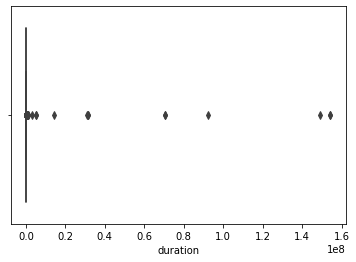

<IPython.core.display.Javascript object>

In [54]:
sns.boxplot(x=df3.duration)

In [55]:
df3 = df3.loc[lambda x: x.duration < 500000].copy()
df3

,_id,user,start_time,max_elevation,bounds,uphill,moving_time,end_time,max_speed,difficulty,...,difficulty_combined,category,uphill_ratio,downhill_ratio,net_elevation,avg_moving_speed,bounds_length,avg_lat,avg_lon,duration
0,5afb229e8f80884aaad9c6ea,Bergfritz,2018-05-11 07:37:40,1934.470000,"{'min': {'type': 'Point', 'coordinates': [13.2...",612.880000,12155.0,2018-05-11 11:38:23,1.595493,T2 - Mountain hike,...,T2,Mountain,0.050422,0.050158,611.510000,1.122039,3077.829492,47.221126,13.228462,14443.0
1,5afb229e8f80884aaad9c6eb,Bergfritz,2018-05-12 07:25:08,2186.210000,"{'min': {'type': 'Point', 'coordinates': [13.1...",614.753000,13876.0,2018-05-12 12:08:28,1.394320,T3 - Difficult Mountain hike,...,T3,Mountain,0.044303,0.086029,919.810000,1.131868,5168.375148,47.243745,13.165418,17000.0
2,5afb229e8f80884aaad9c6ec,igor,2018-05-11 06:29:38,2265.000000,"{'min': {'type': 'Point', 'coordinates': [8.99...",2255.976000,28971.0,2018-05-11 15:32:43,1.503002,T3 - Difficult Mountain hike,...,T3,Mountain,0.077870,0.075166,2088.460000,1.260696,6880.202653,46.205816,8.973514,32585.0
3,5afb229e8f80884aaad9c6ed,rkroebl,2018-05-10 07:06:22,962.420000,"{'min': {'type': 'Point', 'coordinates': [8.43...",882.312000,26726.0,2018-05-10 16:15:18,1.516689,T2 - Mountain hike,...,T2,Mountain,0.033013,0.033714,573.910000,1.073182,12843.840017,46.974467,8.355372,32936.0
4,5afb229e8f80884aaad9c6ee,rkroebl,2018-05-11 05:44:58,697.570000,"{'min': {'type': 'Point', 'coordinates': [8.61...",310.662000,18197.0,2018-05-11 12:54:25,1.542405,T2 - Mountain hike,...,T2,Mountain,0.017072,0.016781,259.070000,0.929306,15065.291514,46.985967,8.514137,25767.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12136,5afb26108f80884aaad9f652,guenter,2013-09-14 10:33:16,1603.135742,"{'min': {'type': 'Point', 'coordinates': [15.5...",672.730664,4306.0,2013-09-14 12:53:09,1.271990,T3 - Difficult Mountain hike,...,T3,Mountain,0.156231,0.001741,666.674316,1.109197,2149.079165,47.740293,15.541210,8393.0
12137,5afb26108f80884aaad9f653,Bergfritz,2013-09-14 05:29:24,1664.660000,"{'min': {'type': 'Point', 'coordinates': [15.2...",928.770000,14660.0,2013-09-14 09:57:36,1.727332,T2 - Mountain hike,...,T2,Mountain,0.063354,0.063157,837.790000,1.115336,4494.273755,47.351675,15.178331,16092.0
12138,5afb26108f80884aaad9f654,mountainrescue,2013-09-15 06:43:39,1658.300000,"{'min': {'type': 'Point', 'coordinates': [15.2...",821.240000,8239.0,2013-09-15 09:21:43,2.106299,T1 - Valley hike,...,T1,Valley,0.099677,0.101838,775.700000,0.929380,2935.081954,47.367339,15.192606,9484.0
12139,5afb26108f80884aaad9f655,Curi,2013-09-07 08:19:07,646.620000,"{'min': {'type': 'Point', 'coordinates': [11.6...",307.855000,18354.0,2013-09-07 15:11:42,1.425461,T1 - Valley hike,...,T1,Valley,0.016773,0.015778,221.580000,1.076629,6839.464153,50.209212,11.594848,24755.0


<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='duration'>

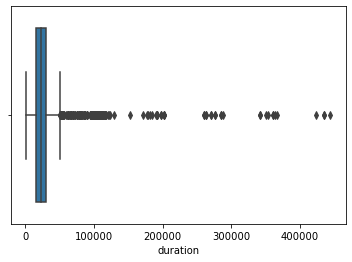

<IPython.core.display.Javascript object>

In [56]:
sns.boxplot(x=df3.duration)

After removing rows that appear to have errors in the duration the longest is 400000 seconds which is approximately 4.5 days. A long hike but still possible

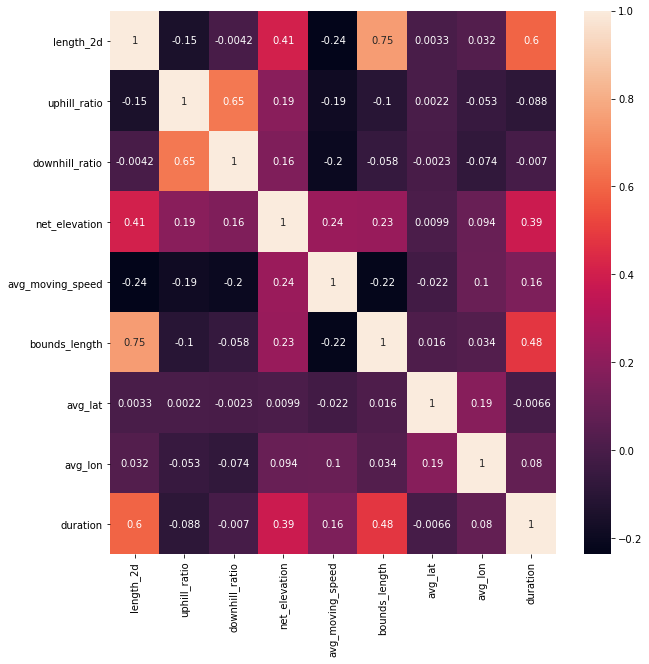

<IPython.core.display.Javascript object>

In [57]:
plt.figure(figsize=(10, 10))
sns.heatmap(
    df3.drop(
        columns=[
            "uphill",
            "downhill",
            "max_elevation",
            "min_elevation",
            "moving_time",
            "max_speed",
        ]
    ).corr(),
    annot=True,
)
plt.show()

Bounds length is highly correlated with length_2d so we will drop it.


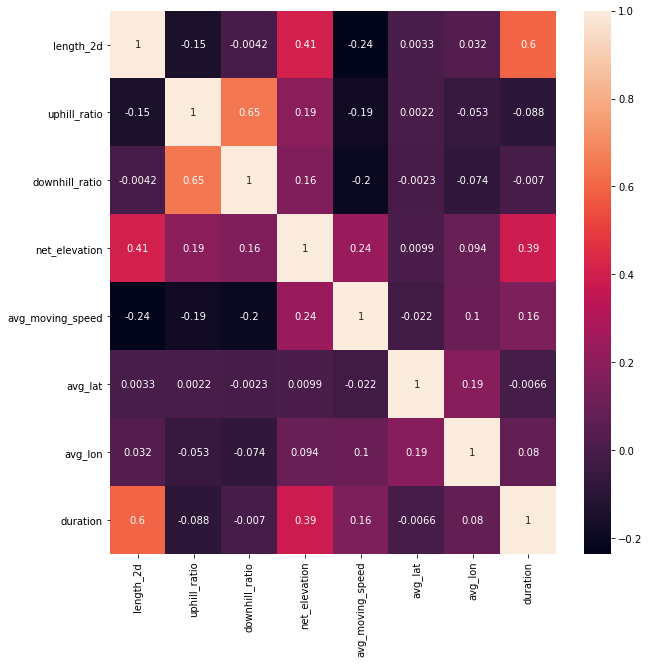

<IPython.core.display.Javascript object>

In [58]:
# Lets take a look at our final feature set
feature_cols = list(
    df3.drop(
        columns=[
            "uphill",
            "downhill",
            "max_elevation",
            "min_elevation",
            "moving_time",
            "max_speed",
            "bounds_length",
        ]
    )
    .select_dtypes(include="number")
    .columns
)
plt.figure(figsize=(10, 10))
sns.heatmap(df3[feature_cols].corr(), annot=True)
plt.show()

### Dimensionality Reduction

#### PCA
We will first try our selected features from above heat-map

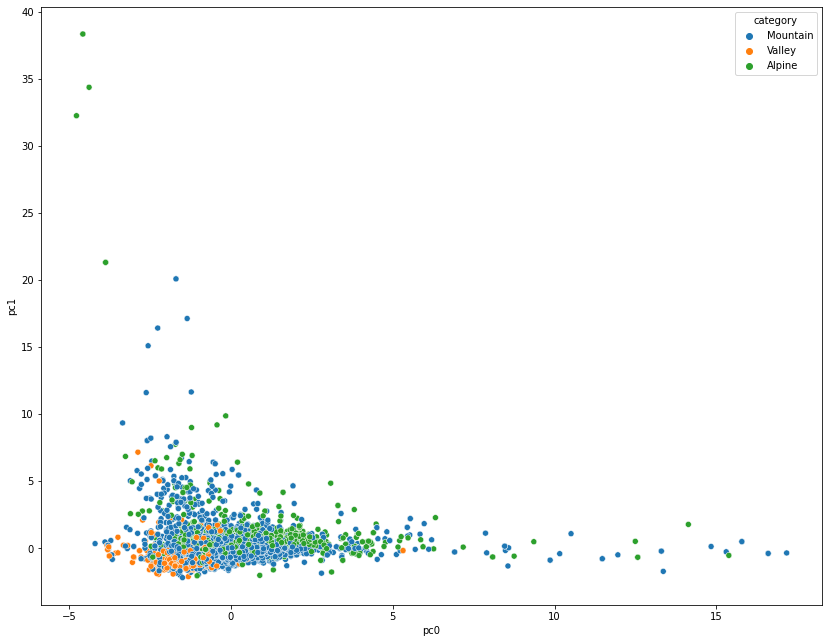

<IPython.core.display.Javascript object>

In [59]:
scale = StandardScaler()
pca = PCA(n_components=2)
steps = [("scale", scale), ("reduce_dim", pca)]
pipe = Pipeline(steps)
X = df3[feature_cols].copy()
X_pca = pd.DataFrame(pipe.fit_transform(X), columns=["pc0", "pc1"], index=df3.index)
X_pca["category"] = df3.category
plt.figure(figsize=(14, 11))
sns.scatterplot(data=X_pca, x="pc0", y="pc1", hue="category")
plt.show()

Let's try pca again with all numeric columns

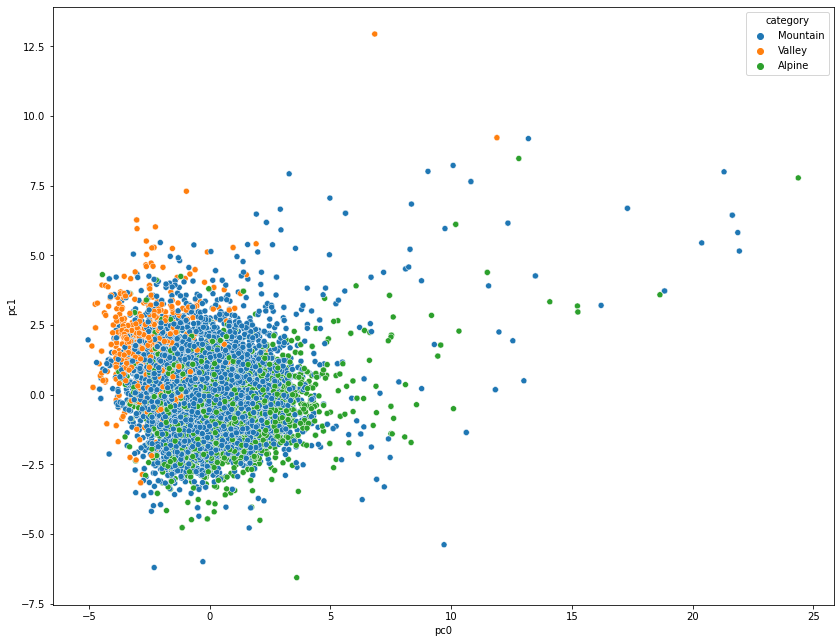

<IPython.core.display.Javascript object>

In [60]:
scale = StandardScaler()
pca = PCA(n_components=2)
steps = [("scale", scale), ("reduce_dim", pca)]
pipe = Pipeline(steps)
X_all_numeric = df3.select_dtypes(include="number").copy()
X_pca_all = pd.DataFrame(
    pipe.fit_transform(X_all_numeric), columns=["pc0", "pc1"], index=df3.index
)
X_pca_all["category"] = df3.category
plt.figure(figsize=(14, 11))
sns.scatterplot(data=X_pca_all, x="pc0", y="pc1", hue="category")
plt.show()

#### Local linear embedding

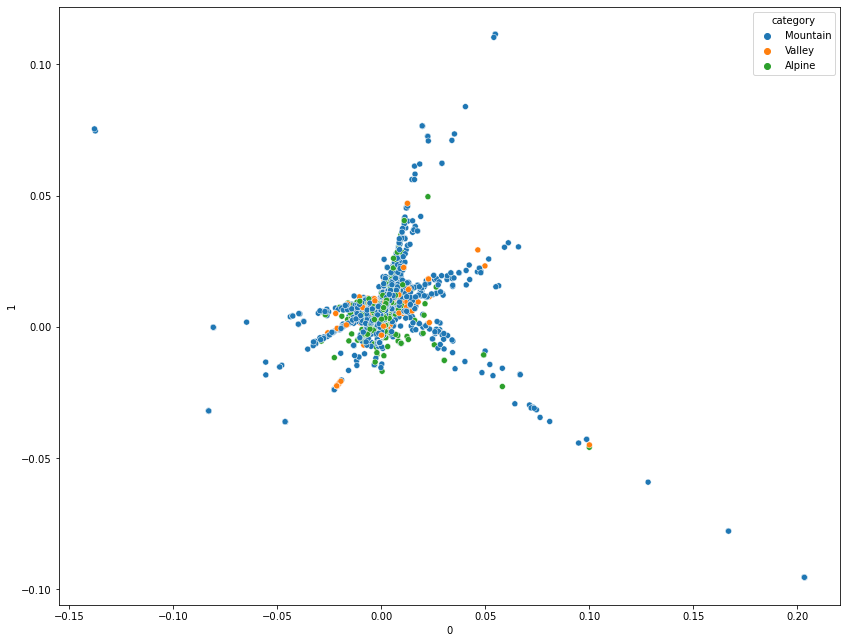

<IPython.core.display.Javascript object>

In [61]:
from sklearn.manifold import LocallyLinearEmbedding, Isomap

lle = LocallyLinearEmbedding(n_components=2)

plt.figure(figsize=(14, 11))
steps = [("scale", scale), ("reduce_dim", lle)]
pipe = Pipeline(steps)
X_lle = pd.DataFrame(pipe.fit_transform(X), columns=["0", "1"], index=df3.index)
X_lle["category"] = df3.category
sns.scatterplot(data=X_lle, x="0", y="1", hue="category")
plt.show()

#### Isomap

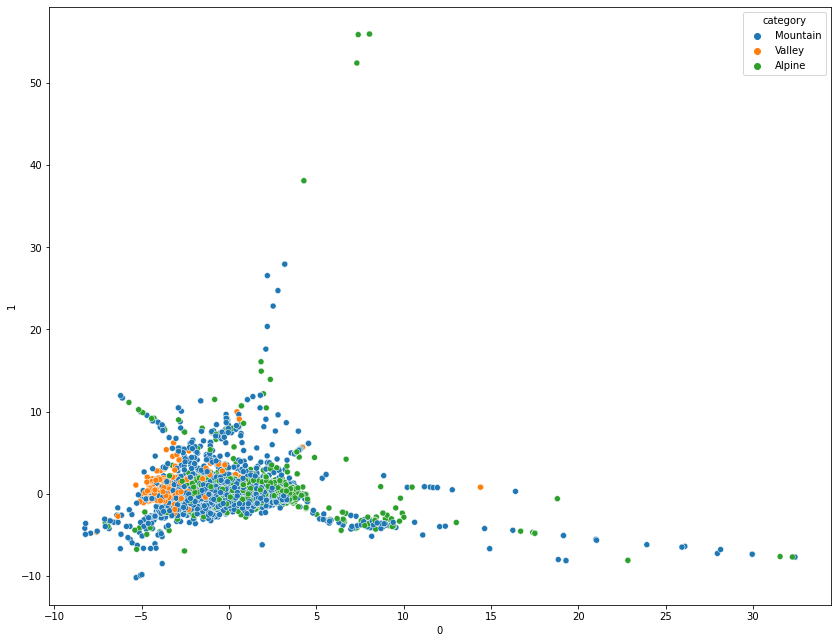

<IPython.core.display.Javascript object>

In [62]:
ism = Isomap(n_components=2)

plt.figure(figsize=(14, 11))
steps = [("scale", scale), ("reduce_dim", ism)]
pipe = Pipeline(steps)
X_ism = pd.DataFrame(pipe.fit_transform(X), columns=["0", "1"], index=df3.index)
X_ism["category"] = df3.category
sns.scatterplot(data=X_ism, x="0", y="1", hue="category")
plt.show()

#### TSNE

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8999 samples in 0.005s...
[t-SNE] Computed neighbors for 8999 samples in 1.356s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8999
[t-SNE] Computed conditional probabilities for sample 2000 / 8999
[t-SNE] Computed conditional probabilities for sample 3000 / 8999
[t-SNE] Computed conditional probabilities for sample 4000 / 8999
[t-SNE] Computed conditional probabilities for sample 5000 / 8999
[t-SNE] Computed conditional probabilities for sample 6000 / 8999
[t-SNE] Computed conditional probabilities for sample 7000 / 8999
[t-SNE] Computed conditional probabilities for sample 8000 / 8999
[t-SNE] Computed conditional probabilities for sample 8999 / 8999
[t-SNE] Mean sigma: 0.272580
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.915199
[t-SNE] KL divergence after 1000 iterations: 1.353935


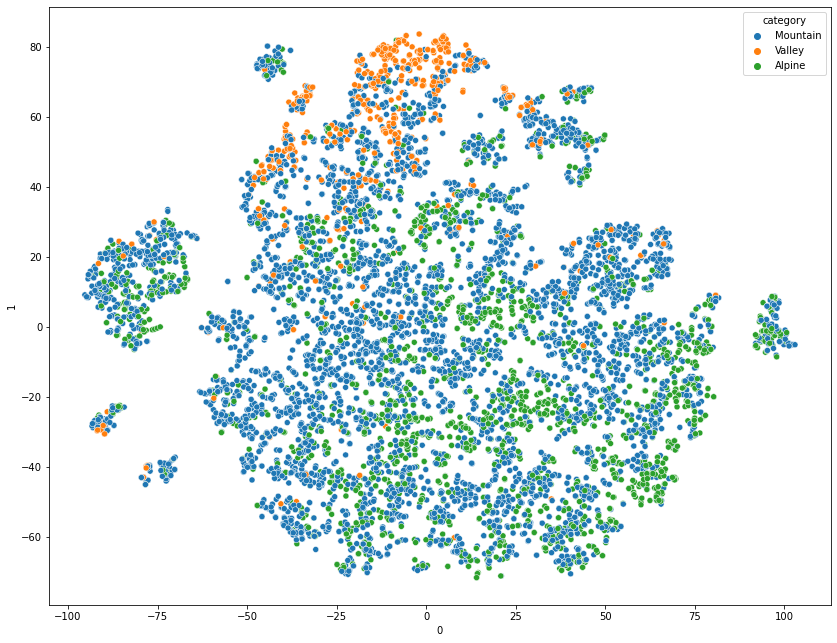

<IPython.core.display.Javascript object>

In [63]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=40, verbose=1)
plt.figure(figsize=(14, 11))

steps = [("scale", scale), ("reduce_dim", tsne)]
pipe = Pipeline(steps)
X_tsne = pd.DataFrame(pipe.fit_transform(X), columns=["0", "1"], index=df3.index)
X_tsne["category"] = df3.category
sns.scatterplot(data=X_tsne, x="0", y="1", hue="category")
plt.show()

perplexity 5


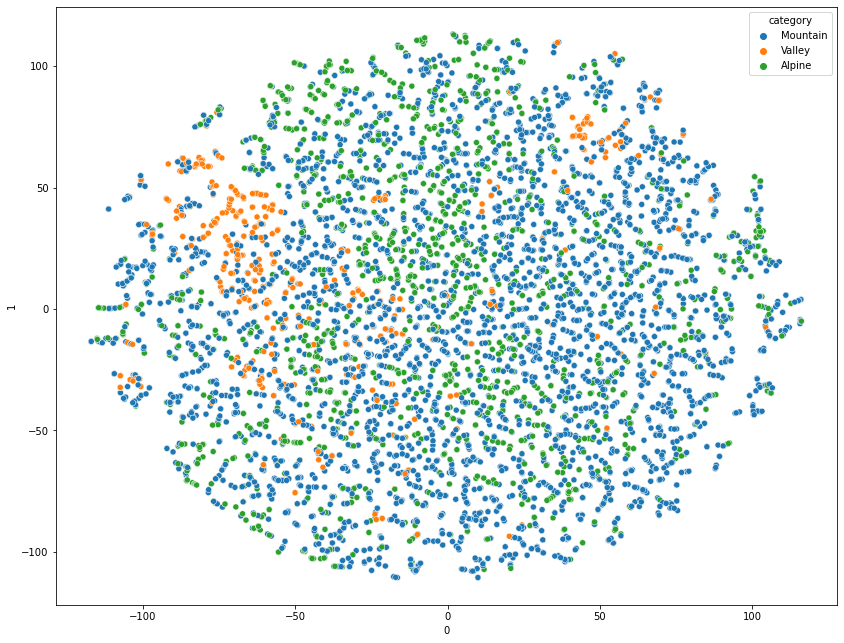

perplexity 8


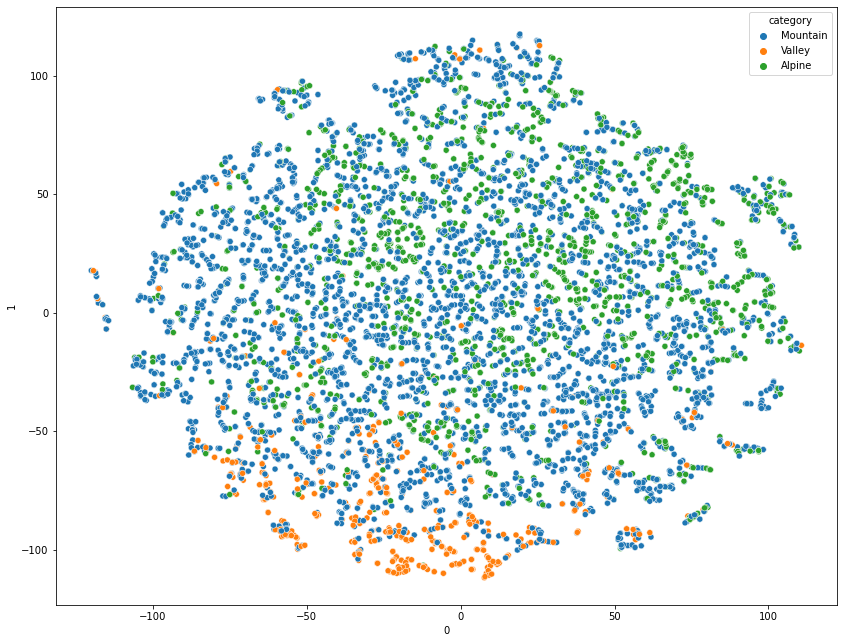

perplexity 20


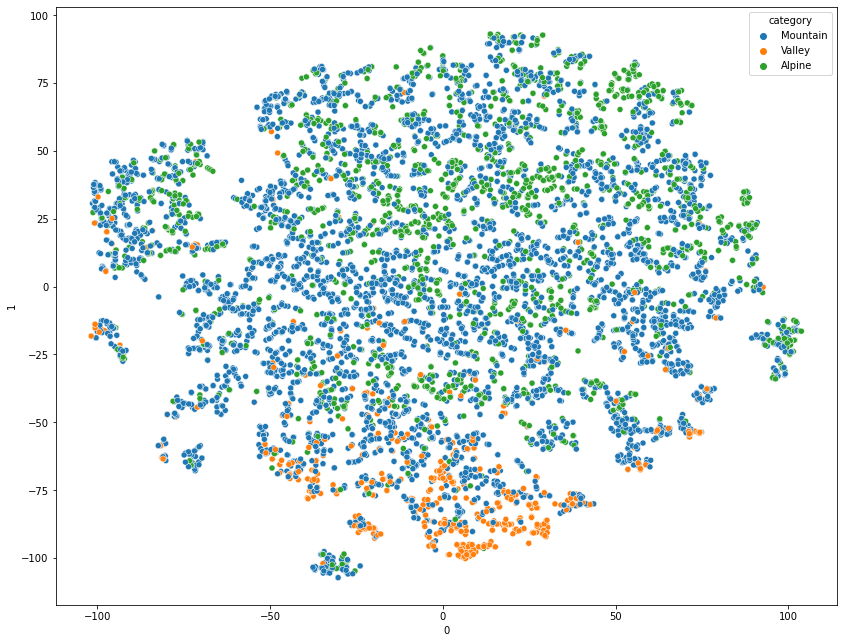

perplexity 40


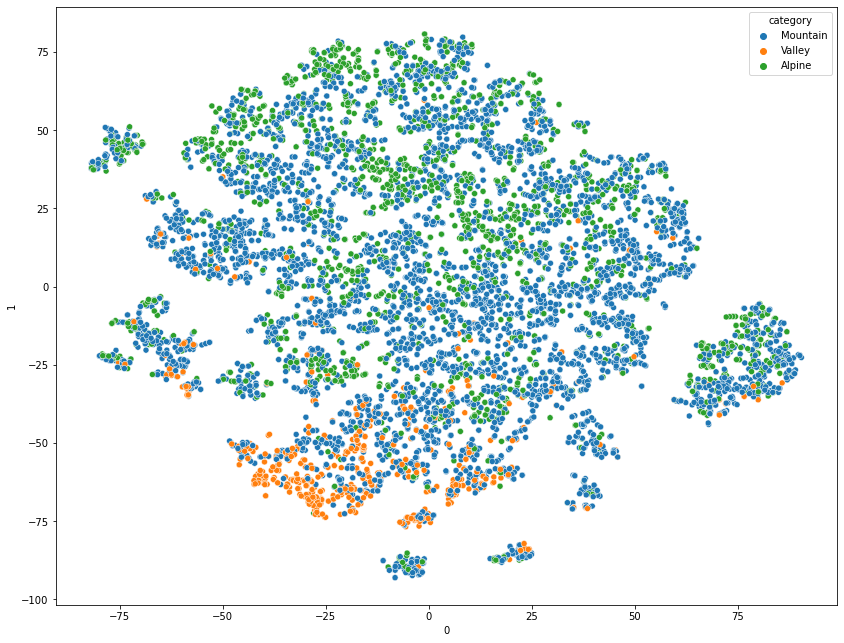

perplexity 80


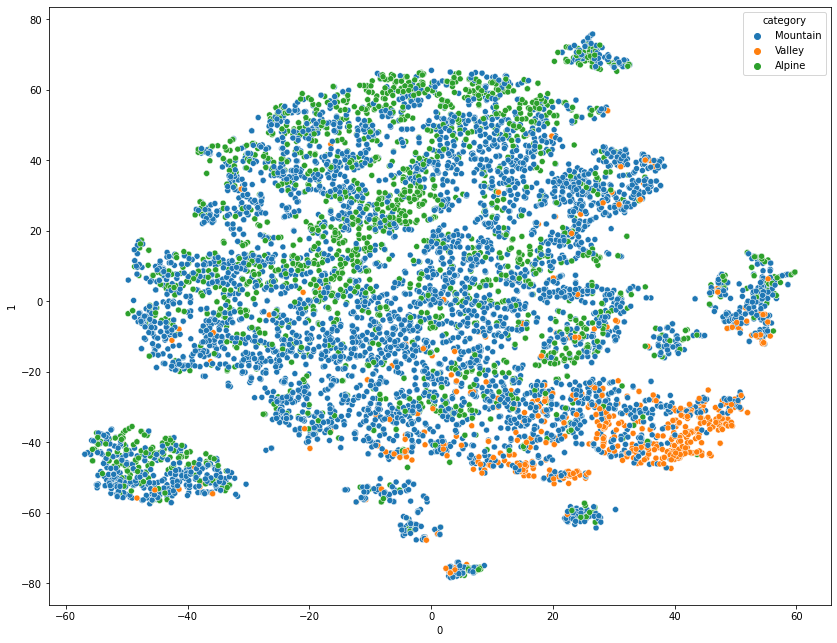

perplexity 100


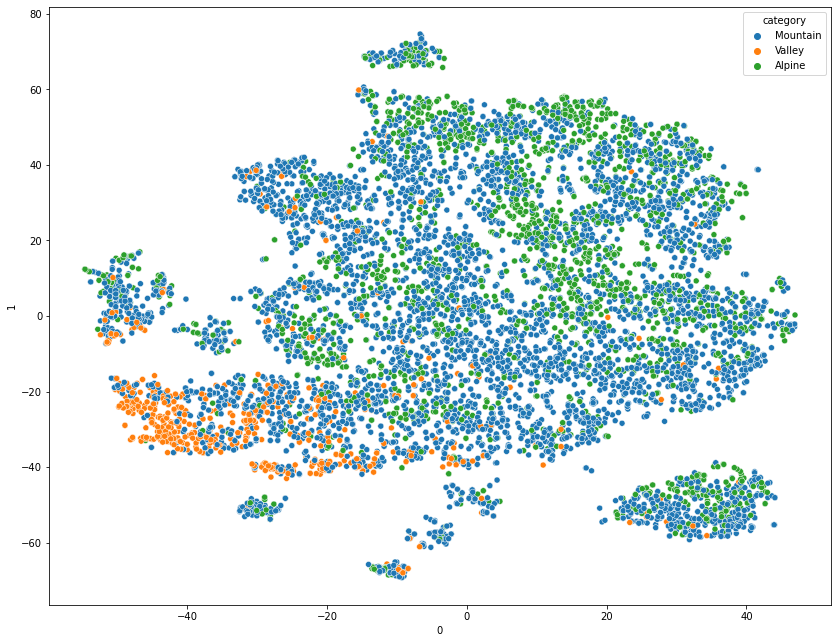

<IPython.core.display.Javascript object>

In [64]:
perplexity = [5, 8, 20, 40, 80, 100]
for p in perplexity:
    tsne = TSNE(n_components=2, perplexity=p)
    plt.figure(figsize=(14, 11))
    steps = [("scale", scale), ("reduce_dim", tsne)]
    pipe = Pipeline(steps)
    X_tsne = pd.DataFrame(pipe.fit_transform(X), columns=["0", "1"], index=df3.index)
    X_tsne["category"] = df3.category
    print(f"perplexity {p}")
    sns.scatterplot(data=X_tsne, x="0", y="1", hue="category")
    plt.show()

#### UMAP

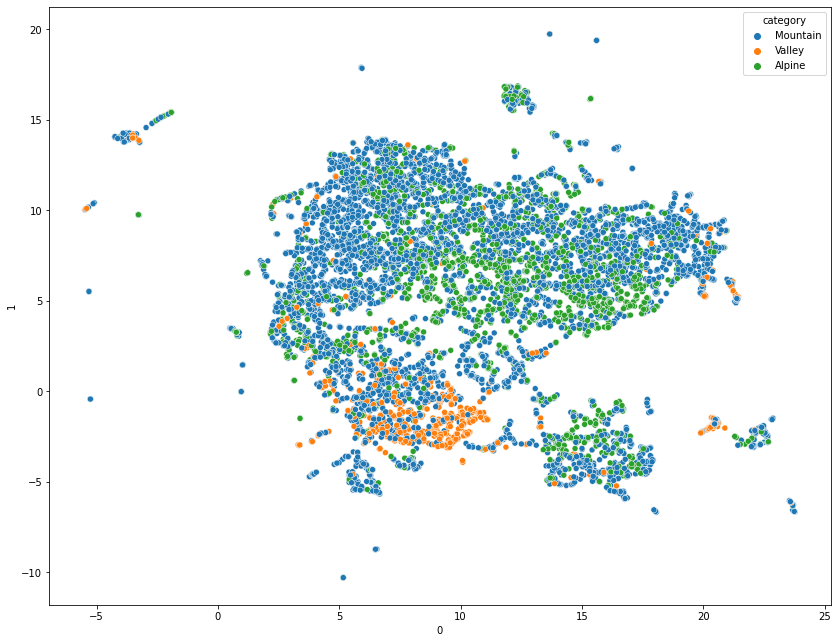

<IPython.core.display.Javascript object>

In [65]:
from umap import UMAP

umap_model = UMAP(n_components=2, n_neighbors=8, min_dist=0.3)
plt.figure(figsize=(14, 11))

steps = [("scale", scale), ("reduce_dim", umap_model)]
pipe = Pipeline(steps)
X_umap = pd.DataFrame(pipe.fit_transform(X), columns=["0", "1"], index=df3.index)
X_umap["category"] = df3.category
sns.scatterplot(data=X_umap, x="0", y="1", hue="category")
plt.show()

Number of neighbors: 5


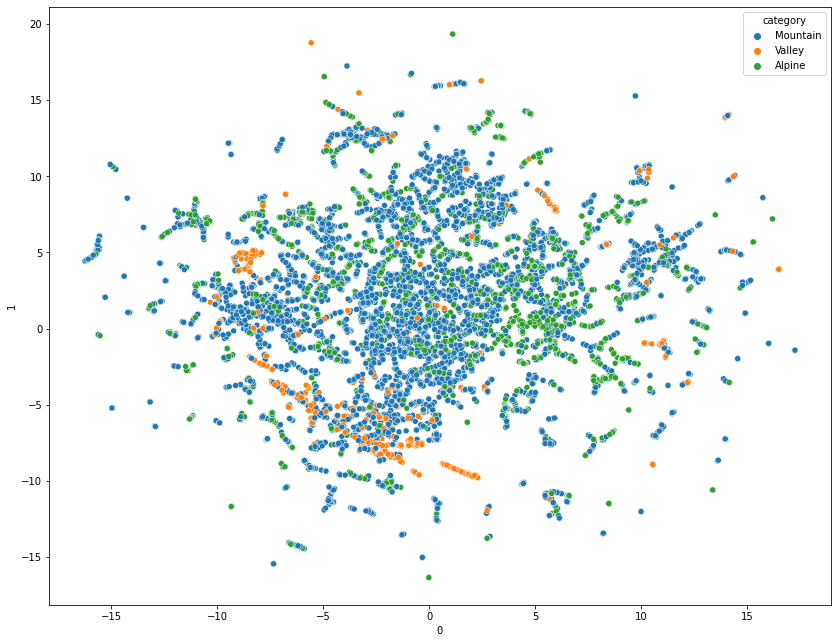

Number of neighbors: 8


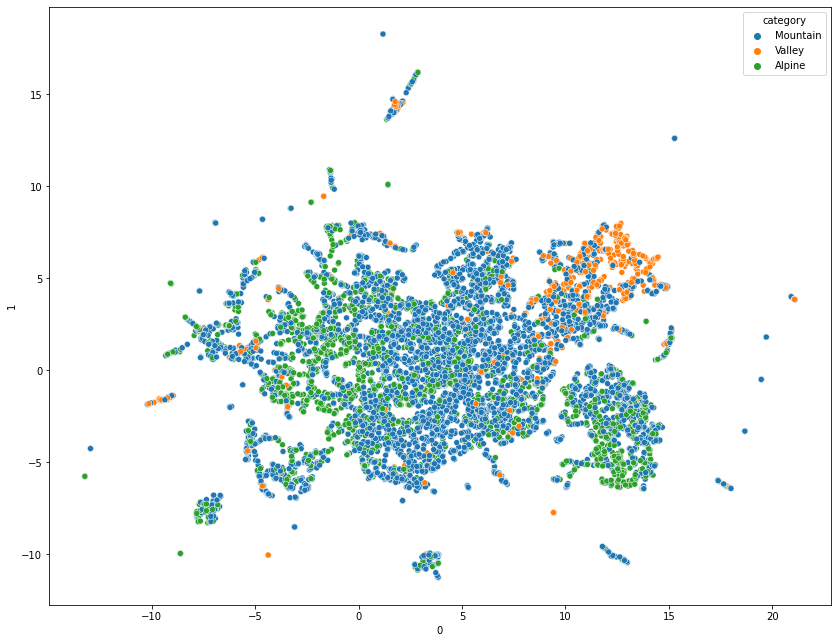

Number of neighbors: 10


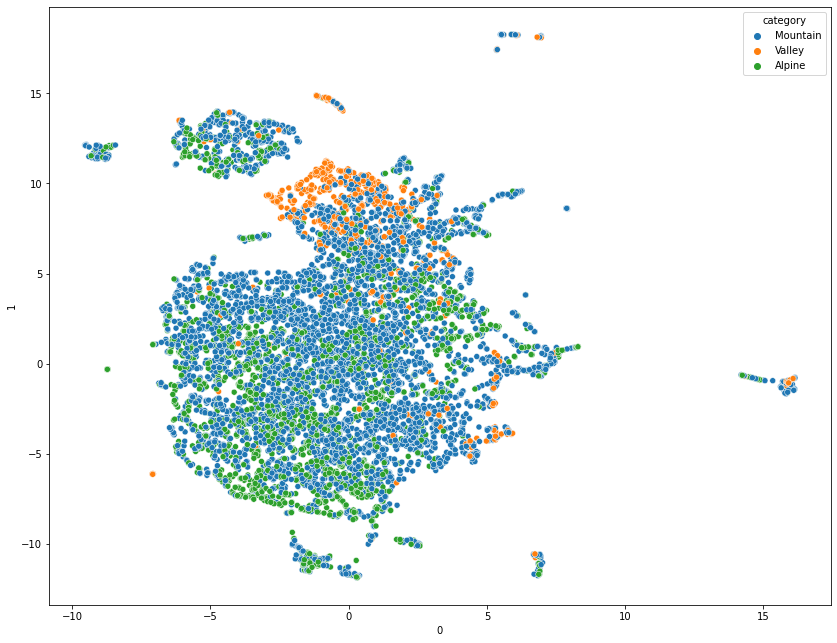

Number of neighbors: 20


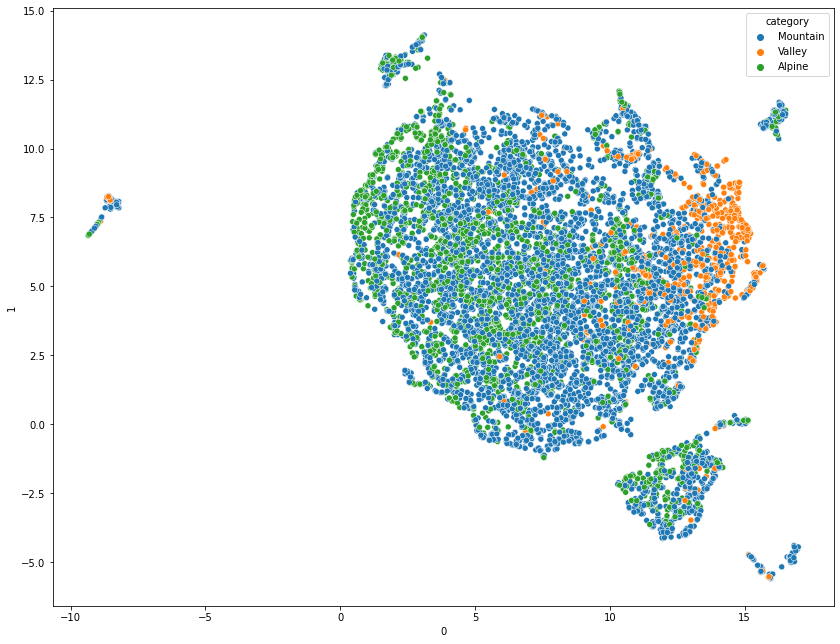

Number of neighbors: 40


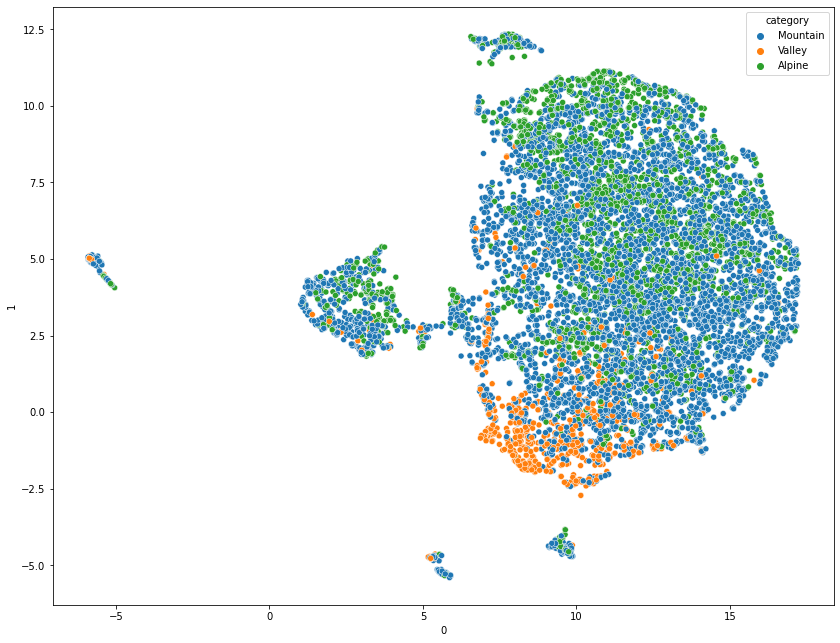

Number of neighbors: 80


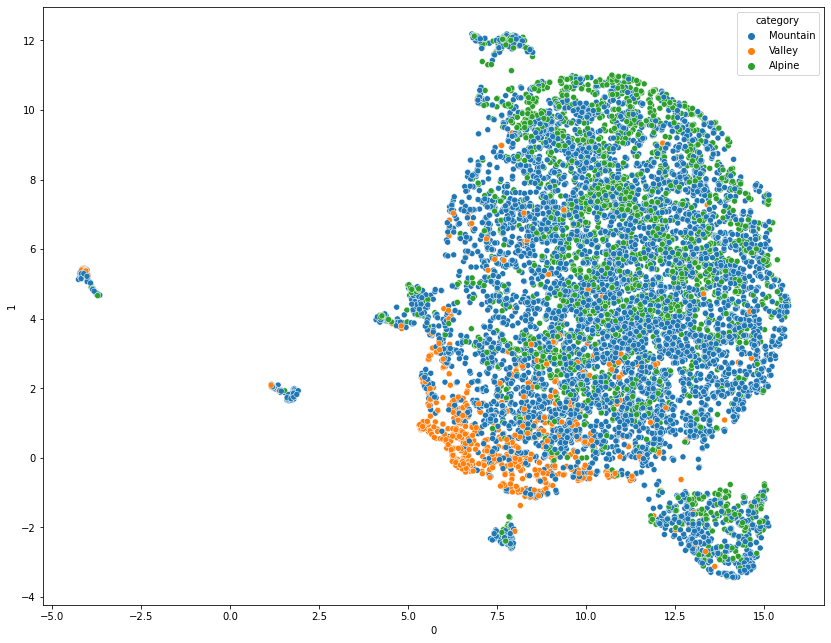

Number of neighbors: 100


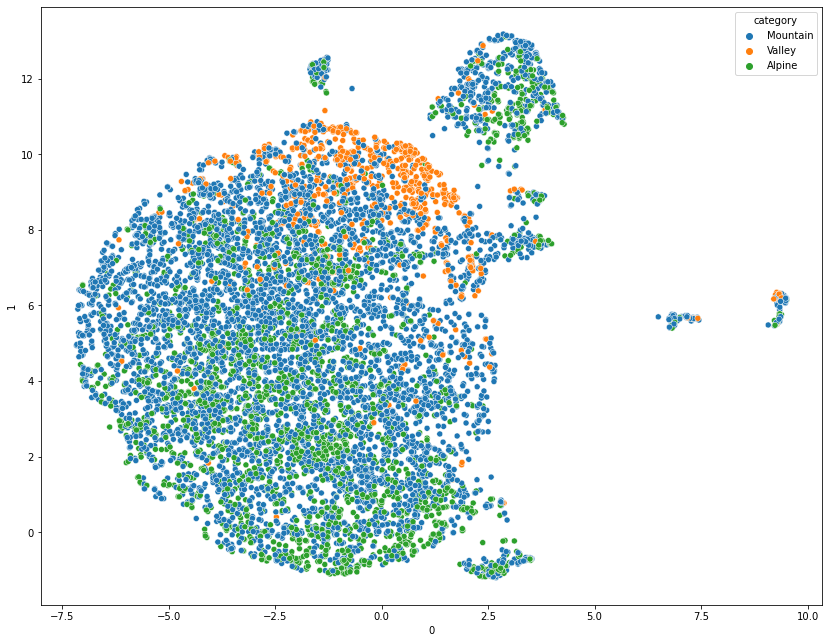

<IPython.core.display.Javascript object>

In [66]:
n_neighbors = [5, 8, 10, 20, 40, 80, 100]
for n in n_neighbors:
    umap_model = UMAP(n_components=2, n_neighbors=n, min_dist=0.3)
    plt.figure(figsize=(14, 11))

    steps = [("scale", scale), ("reduce_dim", umap_model)]
    pipe = Pipeline(steps)
    X_umap = pd.DataFrame(pipe.fit_transform(X), columns=["0", "1"], index=df3.index)
    X_umap["category"] = df3.category
    print(f"Number of neighbors: {n}")
    sns.scatterplot(data=X_umap, x="0", y="1", hue="category")
    plt.show()

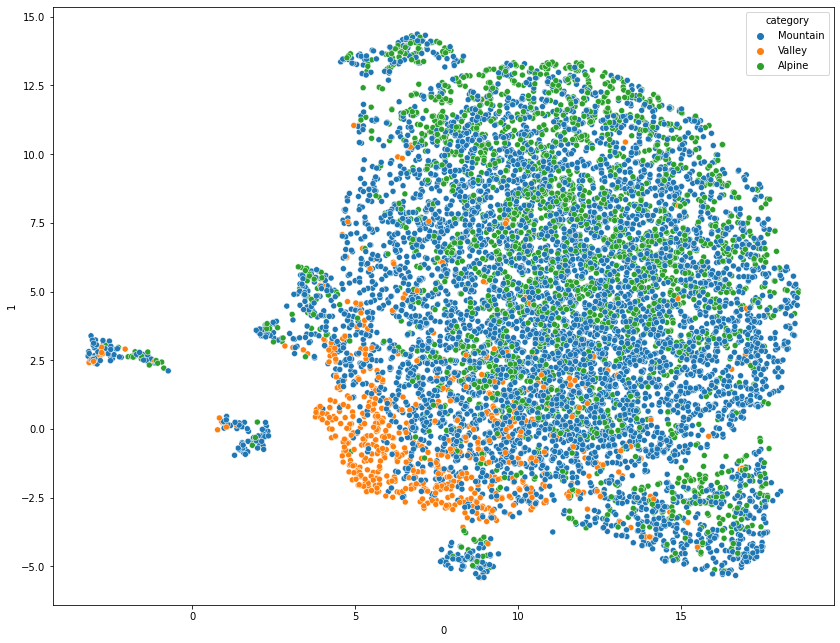

<IPython.core.display.Javascript object>

In [67]:
umap_model = UMAP(n_components=2, n_neighbors=65, min_dist=0.75)
plt.figure(figsize=(14, 11))

steps = [("scale", scale), ("reduce_dim", umap_model)]
pipe = Pipeline(steps)
X_umap = pd.DataFrame(pipe.fit_transform(X), columns=["0", "1"], index=df3.index)
X_umap["category"] = df3.category
sns.scatterplot(data=X_umap, x="0", y="1", hue="category")
plt.show()

### Clustering

#### KMeans

In [68]:
from sklearn.cluster import KMeans

<IPython.core.display.Javascript object>

We'll used the silhouette score plotted against the number of clusters to determine the number of clusters for the KMeans model.

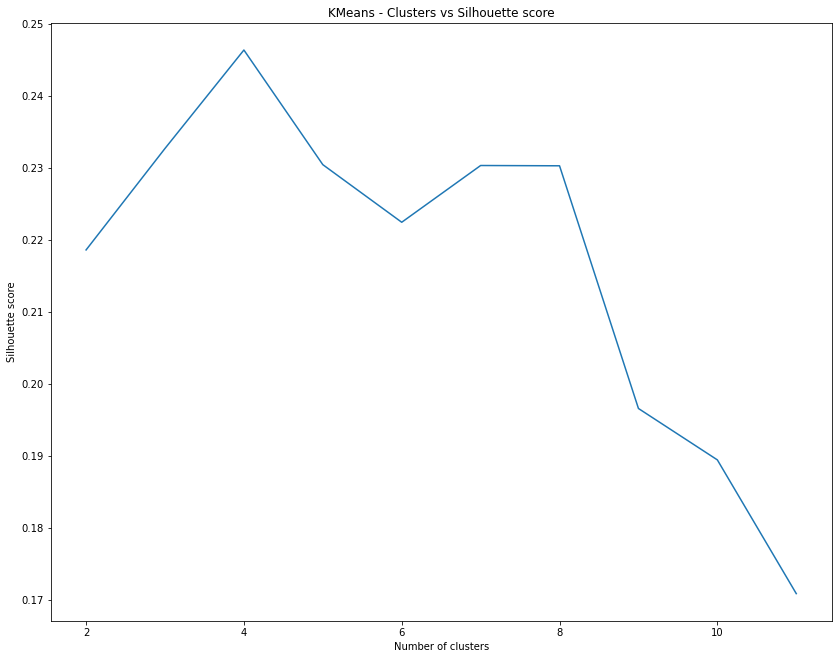

<IPython.core.display.Javascript object>

In [69]:
plt.figure(figsize=(14, 11))
silhouette_scores = []
clusters = list(range(2, 12))
scale = StandardScaler()
X_scale = scale.fit_transform(X)
for n in clusters:
    kmeans = KMeans(n_clusters=n, n_init=5)
    kmeans.fit(X_scale)
    silhouette_scores.append(silhouette_score(X_scale, kmeans.predict(X_scale)))


plt.plot(clusters, silhouette_scores)
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette score")
plt.title("KMeans - Clusters vs Silhouette score")
plt.show()

It looks like the 4 cluster model has the highest score.

Lets try the same plot but this time using the components of the umap model as inputs to KMeans

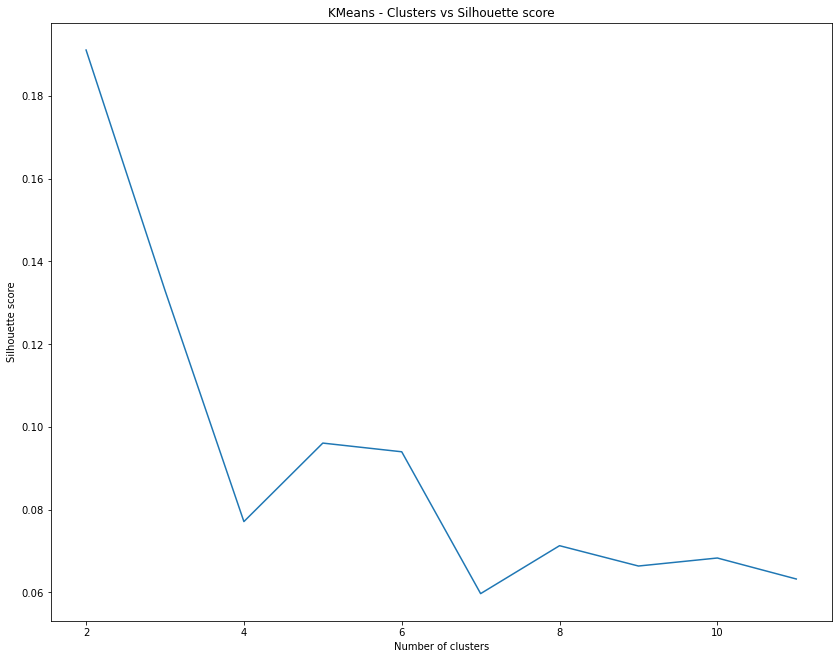

<IPython.core.display.Javascript object>

In [70]:
plt.figure(figsize=(14, 11))
silhouette_scores = []
clusters = list(range(2, 12))
scale = StandardScaler()
X_scale = scale.fit_transform(X)
umap_model = UMAP(n_components=2, n_neighbors=65, min_dist=0.75)
for n in clusters:
    kmeans = KMeans(n_clusters=n, n_init=5)
    steps = [("reduce_dim", umap_model), ("cluster", kmeans)]
    pipe = Pipeline(steps)
    pipe.fit(X_scale)
    silhouette_scores.append(silhouette_score(X_scale, pipe.predict(X_scale)))


plt.plot(clusters, silhouette_scores)
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette score")
plt.title("KMeans - Clusters vs Silhouette score")
plt.show()

It looks like this method produces overall lower scores.

Lets plot our 4 cluster KMeans model.

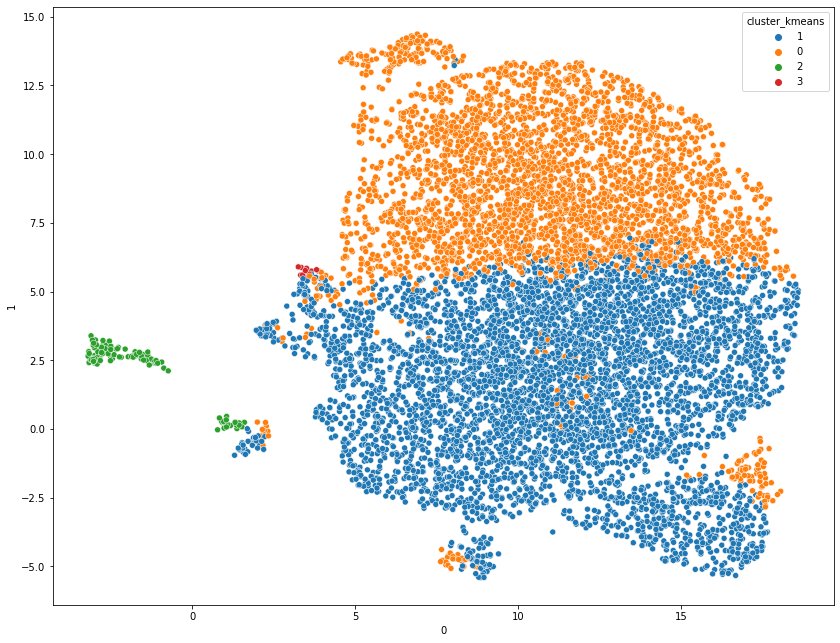

1    5343
0    3534
2     109
3      13
Name: cluster_kmeans, dtype: int64
0.2342959826532501


<IPython.core.display.Javascript object>

In [71]:
plt.figure(figsize=(14, 11))
kmeans = KMeans(n_clusters=4, n_init=5)
steps = [("scale", scale), ("cluster", kmeans)]
pipe = Pipeline(steps)
clusters_kmeans = pipe.fit_predict(X)
X_umap["cluster_kmeans"] = clusters_kmeans.astype(str)
sns.scatterplot(data=X_umap, x="0", y="1", hue="cluster_kmeans")
plt.show()
print(X_umap["cluster_kmeans"].value_counts())
print(silhouette_score(X_scale, clusters_kmeans))

In [72]:
df_kmeans = df3.copy()
df_kmeans["cluster_kmeans"] = clusters_kmeans

<IPython.core.display.Javascript object>

In [74]:
aggs = {
    "length_2d": "mean",
    "uphill_ratio": "mean",
    "downhill_ratio": "mean",
    "net_elevation": "mean",
    "avg_moving_speed": "mean",
    "avg_lat": "mean",
    "avg_lon": "mean",
    "duration": "mean",
    "cluster_kmeans": "count",
}
df_kmeans.groupby(by="cluster_kmeans").agg(aggs).style.background_gradient()

,length_2d,uphill_ratio,downhill_ratio,net_elevation,avg_moving_speed,avg_lat,avg_lon,duration,cluster_kmeans
cluster_kmeans,,,,,,,,,
0,18372.437071,0.075949,0.073051,1358.988404,1.221169,46.161357,9.494032,35014.355405,3534
1,10344.999638,0.071168,0.057912,684.014462,1.194172,46.476988,9.489294,17782.076549,5343
2,10879.637905,0.077117,0.073837,481.347526,0.934190,29.527350,-103.977300,10609.752294,109
3,5671.401842,1.175701,1.104099,750.753846,0.874558,44.463693,-19.656195,7409.153846,13


<IPython.core.display.Javascript object>

In [132]:
kmeans_results = pd.DataFrame(
    [
        [
            "kmeans",
            silhouette_score(X_scale, clusters_kmeans),
            X_umap["cluster_kmeans"].value_counts().array,
        ]
    ],
    columns=["model", "score", "clusters counts"],
)
kmeans_results

,model,score,clusters counts
0,kmeans,0.234296,"[5343, 3534, 109, 13]"


<IPython.core.display.Javascript object>

#### Agglomerative

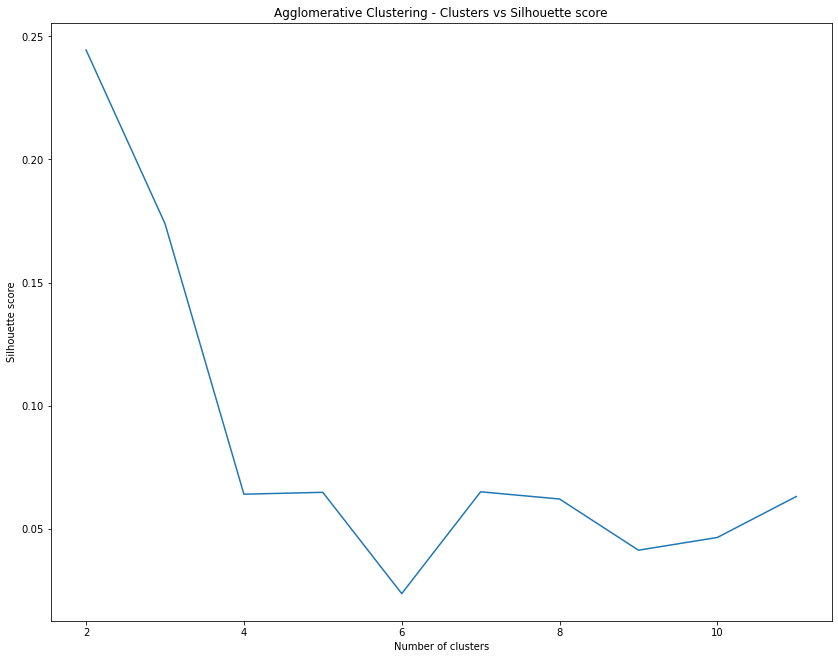

<IPython.core.display.Javascript object>

In [75]:
from sklearn.cluster import AgglomerativeClustering

plt.figure(figsize=(14, 11))
silhouette_scores = []
clusters = list(range(2, 12))
scale = StandardScaler()
X_scale = scale.fit_transform(X)
umap_model = UMAP(n_components=2, n_neighbors=65, min_dist=0.75)
for n in clusters:
    ac = AgglomerativeClustering(n_clusters=n)
    steps = [("reduce_dim", umap_model), ("cluster", ac)]
    pipe = Pipeline(steps)
    clusters_ac = pipe.fit_predict(X_scale)
    silhouette_scores.append(silhouette_score(X_scale, clusters_ac))

plt.plot(clusters, silhouette_scores)
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette score")
plt.title("Agglomerative Clustering - Clusters vs Silhouette score")
plt.show()

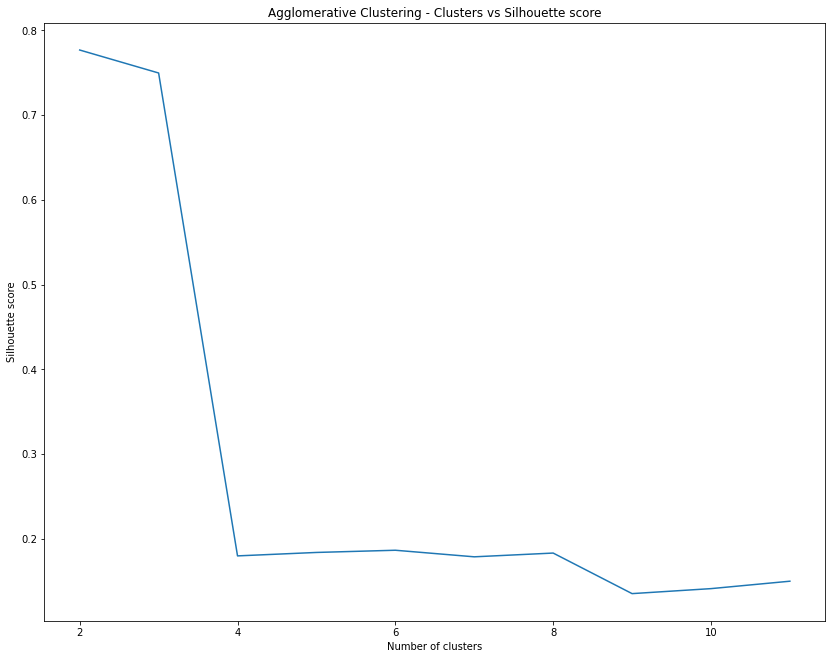

<IPython.core.display.Javascript object>

In [76]:
plt.figure(figsize=(14, 11))
silhouette_scores = []
clusters = list(range(2, 12))
scale = StandardScaler()
X_scale = scale.fit_transform(X)
for n in clusters:
    ac = AgglomerativeClustering(n_clusters=n)
    clusters_ac = ac.fit_predict(X_scale)
    silhouette_scores.append(silhouette_score(X_scale, clusters_ac))

plt.plot(clusters, silhouette_scores)
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette score")
plt.title("Agglomerative Clustering - Clusters vs Silhouette score")
plt.show()

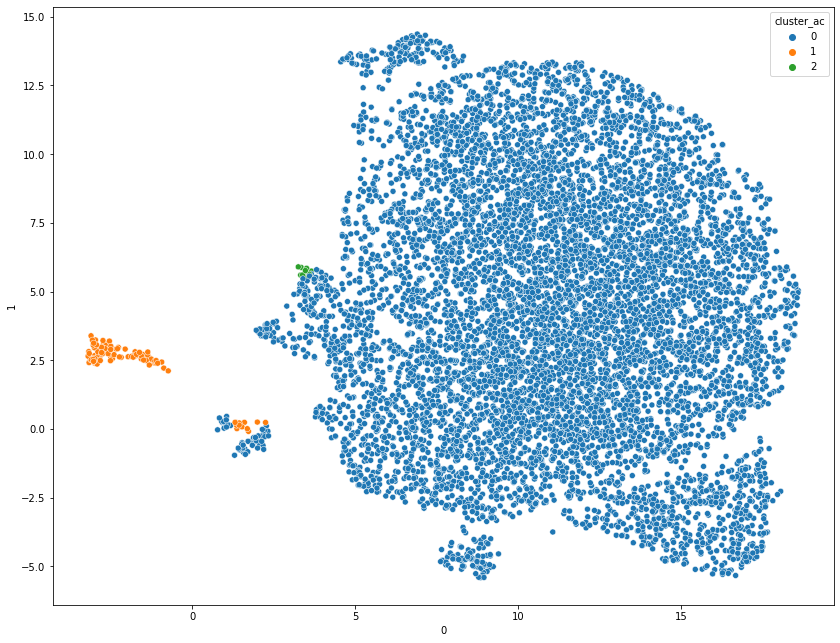

0    8889
1      99
2      11
Name: cluster_ac, dtype: int64
0.7497276572935428


<IPython.core.display.Javascript object>

In [77]:
plt.figure(figsize=(14, 11))
ac = AgglomerativeClustering(n_clusters=3)
steps = [("scale", scale), ("cluster", ac)]
pipe = Pipeline(steps)
clusters_ac = pipe.fit_predict(X)
X_umap["cluster_ac"] = clusters_ac.astype(str)
sns.scatterplot(data=X_umap, x="0", y="1", hue="cluster_ac")
plt.show()
print(X_umap["cluster_ac"].value_counts())
print(silhouette_score(X_scale, clusters_ac))

The Agglomerative clustering model has a high score but almost all of the data is in a single cluster, not very useful. 

In [80]:
df_ac = df3.copy()
df_ac["cluster_ac"] = clusters_ac

aggs = {
    "length_2d": "mean",
    "uphill_ratio": "mean",
    "downhill_ratio": "mean",
    "net_elevation": "mean",
    "avg_moving_speed": "mean",
    "avg_lat": "mean",
    "avg_lon": "mean",
    "duration": "mean",
    "cluster_ac": "count",
}
df_ac.groupby(by="cluster_ac").agg(aggs).style.background_gradient()

,length_2d,uphill_ratio,downhill_ratio,net_elevation,avg_moving_speed,avg_lat,avg_lon,duration,cluster_ac
cluster_ac,,,,,,,,,
0,13529.347612,0.073156,0.064034,952.009765,1.205040,46.331837,9.332615,24619.338058,8889
1,11491.014527,0.081834,0.077180,492.357478,0.896979,29.568533,-101.233841,11005.939394,99
2,5559.370045,1.268775,1.194908,765.707273,0.806157,44.209605,-24.664660,6569.545455,11


<IPython.core.display.Javascript object>

In [134]:
agglomerative_results = pd.DataFrame(
    [
        [
            "agglomerative",
            silhouette_score(X_scale, clusters_ac),
            X_umap["cluster_ac"].value_counts().array,
        ]
    ],
    columns=["model", "score", "clusters counts"],
)
agglomerative_results

,model,score,clusters counts
0,agglomerative,0.749728,"[8889, 99, 11]"


<IPython.core.display.Javascript object>

#### DBScan

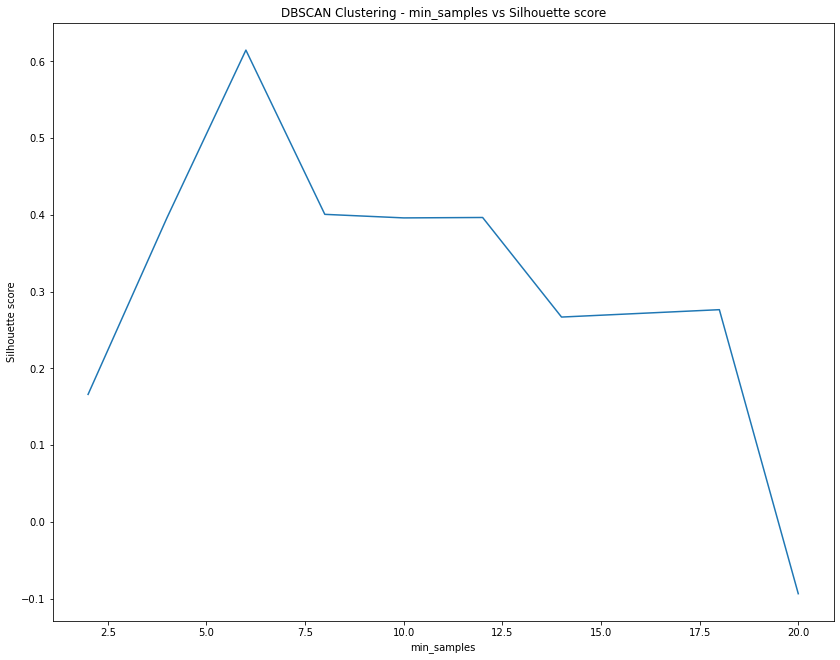

<IPython.core.display.Javascript object>

In [81]:
from sklearn.cluster import DBSCAN

plt.figure(figsize=(14, 11))
silhouette_scores = []
min_samples = [2, 4, 6, 8, 10, 12, 14, 18, 20]
scale = StandardScaler()
X_scale = scale.fit_transform(X)
umap_model = UMAP(n_components=2, n_neighbors=65, min_dist=0.75)
for n in min_samples:
    dbs = DBSCAN(eps=0.5, min_samples=n)
    steps = [("reduce_dim", umap_model), ("cluster", dbs)]
    pipe = Pipeline(steps)
    clusters_dbs = pipe.fit_predict(X_scale)
    silhouette_scores.append(silhouette_score(X_scale, clusters_dbs))

plt.plot(min_samples, silhouette_scores)
plt.xlabel("min_samples")
plt.ylabel("Silhouette score")
plt.title("DBSCAN Clustering - min_samples vs Silhouette score")
plt.show()

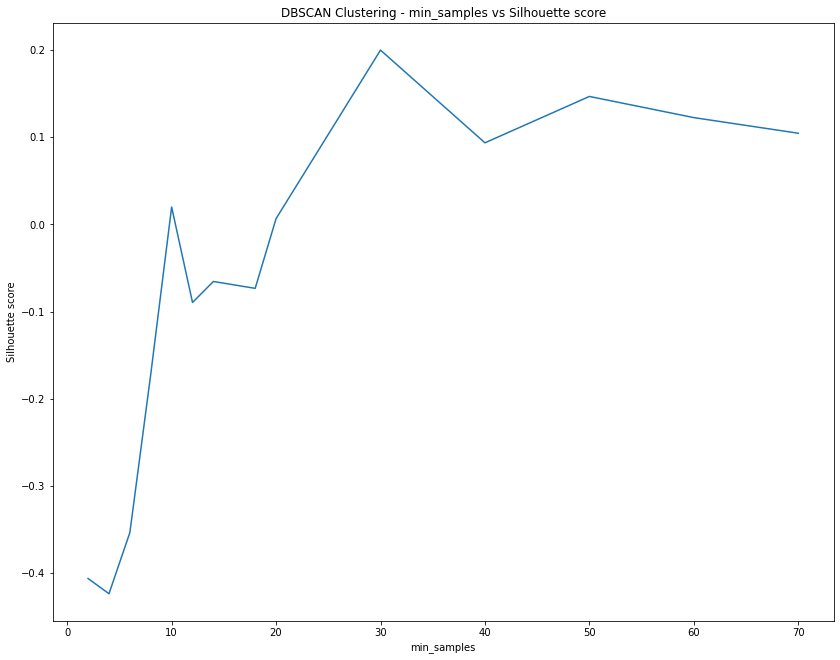

<IPython.core.display.Javascript object>

In [82]:
plt.figure(figsize=(14, 11))
silhouette_scores = []
min_samples = [2, 4, 6, 8, 10, 12, 14, 18, 20, 30, 40, 50, 60, 70]
scale = StandardScaler()
X_scale = scale.fit_transform(X)
for n in min_samples:
    dbs = DBSCAN(eps=0.5, min_samples=n)
    clusters_dbs = dbs.fit_predict(X_scale)
    silhouette_scores.append(silhouette_score(X_scale, clusters_dbs))

plt.plot(min_samples, silhouette_scores)
plt.xlabel("min_samples")
plt.ylabel("Silhouette score")
plt.title("DBSCAN Clustering - min_samples vs Silhouette score")
plt.show()

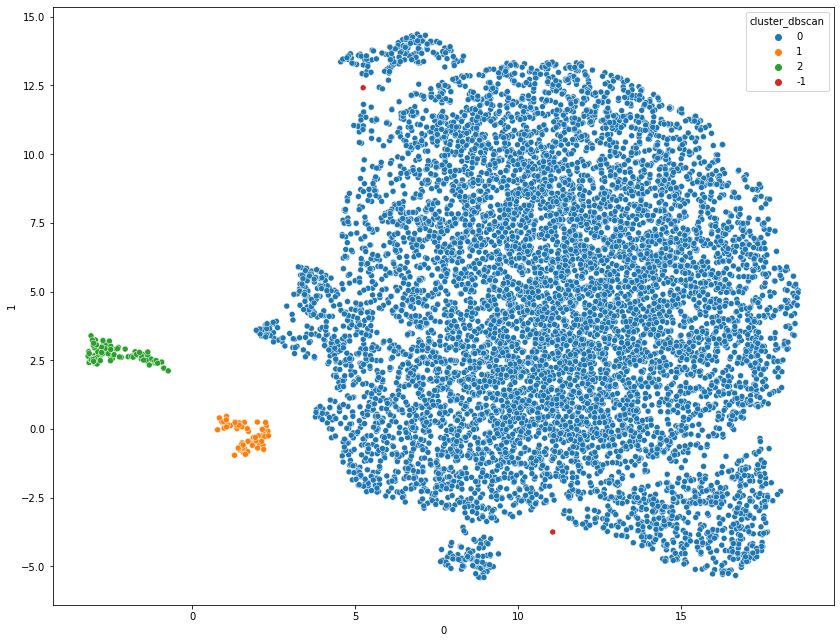

0     8837
2       86
1       74
-1       2
Name: cluster_dbscan, dtype: int64
0.6755185968778857


<IPython.core.display.Javascript object>

In [83]:
dbs = DBSCAN(eps=0.5, min_samples=6)
umap_model = UMAP(n_components=2, n_neighbors=65, min_dist=0.75)
plt.figure(figsize=(14, 11))
steps = [("scale", scale), ("reduce_dim", umap_model), ("cluster", dbs)]
pipe = Pipeline(steps)
clusters_dbs = pipe.fit_predict(X)
X_umap["cluster_dbscan"] = clusters_dbs.astype(str)
sns.scatterplot(data=X_umap, x="0", y="1", hue="cluster_dbscan")
plt.show()
print(X_umap["cluster_dbscan"].value_counts())
print(silhouette_score(X_scale, clusters_dbs))

In [136]:
dbscan_results = pd.DataFrame(
    [
        [
            "dbscan",
            silhouette_score(X_scale, clusters_dbs),
            X_umap["cluster_dbscan"].value_counts().array,
        ]
    ],
    columns=["model", "score", "clusters counts"],
)
dbscan_results

,model,score,clusters counts
0,dbscan,0.675519,"[8837, 86, 74, 2]"


<IPython.core.display.Javascript object>

Similar to the Agglomerative clustering model, the DBSCAN model has a fairly high silhouette score but it grouped almost all the data into one cluster. 

#### Gaussian Mixture Model

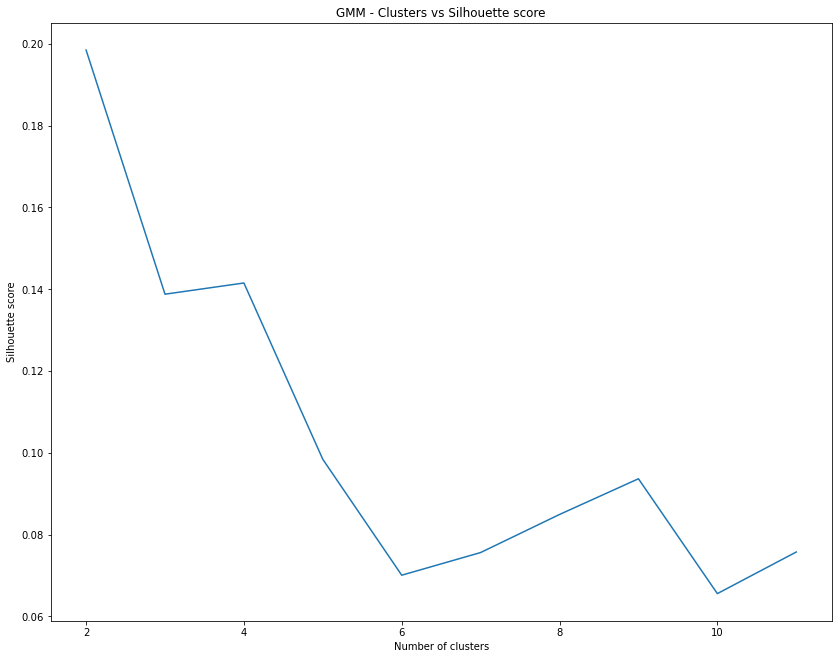

<IPython.core.display.Javascript object>

In [84]:
from sklearn.mixture import GaussianMixture

silhouette_scores = []
clusters = list(range(2, 12))
scale = StandardScaler()
X_scale = scale.fit_transform(X)
for n in clusters:
    gmm = GaussianMixture(n_components=n, n_init=5)
    steps = [("reduce_dim", umap_model), ("cluster", gmm)]
    pipe = Pipeline(steps)
    pipe.fit(X_scale)
    silhouette_scores.append(silhouette_score(X_scale, pipe.predict(X_scale)))

plt.figure(figsize=(14, 11))
plt.plot(clusters, silhouette_scores)
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette score")
plt.title("GMM - Clusters vs Silhouette score")
plt.show()

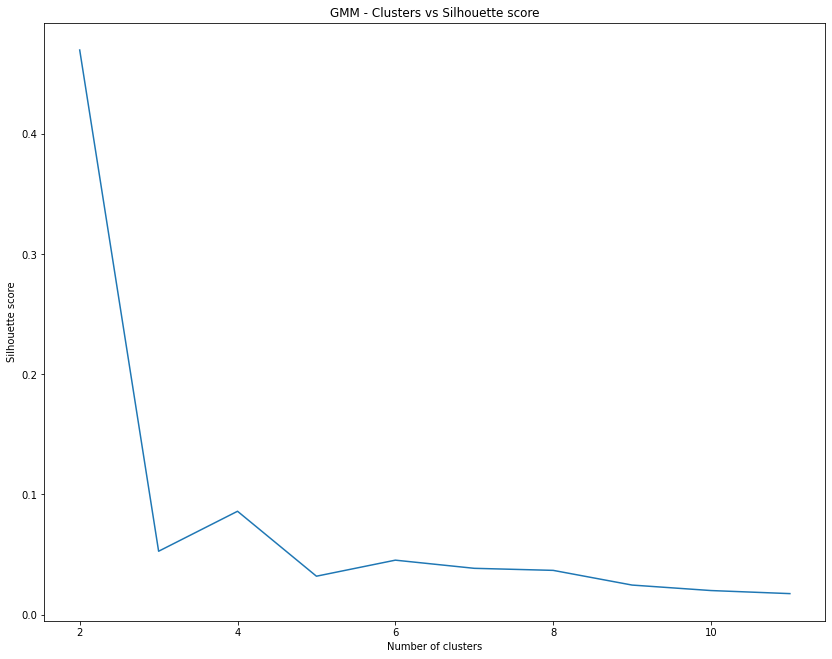

<IPython.core.display.Javascript object>

In [85]:
silhouette_scores = []
clusters = list(range(2, 12))
scale = StandardScaler()
X_scale = scale.fit_transform(X)
for n in clusters:
    gmm = GaussianMixture(n_components=n, n_init=5)
    gmm.fit(X_scale)
    silhouette_scores.append(silhouette_score(X_scale, gmm.predict(X_scale)))

plt.figure(figsize=(14, 11))
plt.plot(clusters, silhouette_scores)
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette score")
plt.title("GMM - Clusters vs Silhouette score")
plt.show()

In [ ]:
plt.figure(figsize=(14, 11))
gmm = GaussianMixture(n_components=3, n_init=5)
steps = [("scale", scale), ("reduce_dim", umap_model), ("cluster", gmm)]
pipe = Pipeline(steps)
clusters_gmm = pipe.fit_predict(X)
X_umap["cluster_gmm"] = clusters_gmm.astype(str)
sns.scatterplot(data=X_umap, x="0", y="1", hue="cluster_gmm")
plt.show()
print(X_umap["cluster_gmm"].value_counts())
print(silhouette_score(X_scale, clusters_gmm))

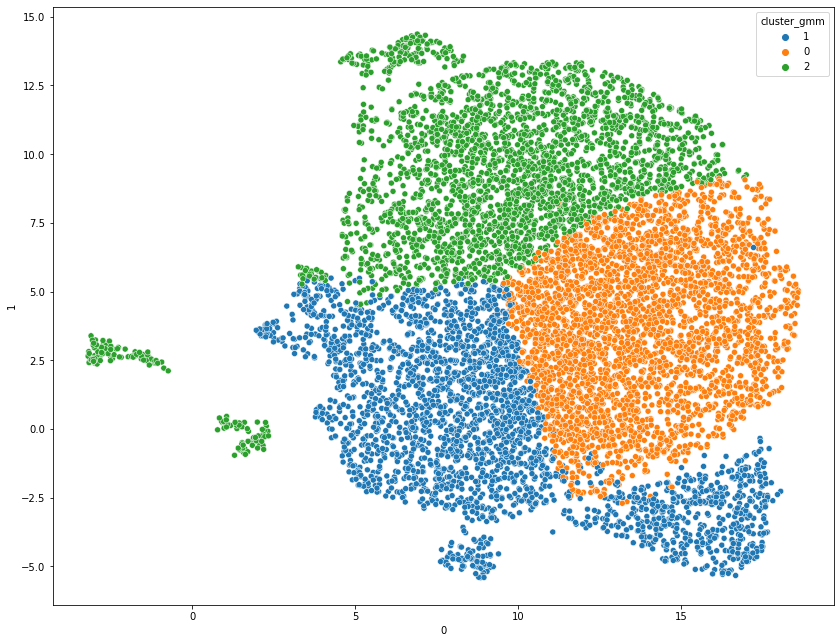

0    3368
2    2901
1    2730
Name: cluster_gmm, dtype: int64
0.11483516325612549


<IPython.core.display.Javascript object>

In [88]:
plt.figure(figsize=(14, 11))
gmm = GaussianMixture(n_components=3, n_init=5)
steps = [("scale", scale), ("reduce_dim", umap_model), ("cluster", gmm)]
pipe = Pipeline(steps)
clusters_gmm = pipe.fit_predict(X)
X_umap["cluster_gmm"] = clusters_gmm.astype(str)
sns.scatterplot(data=X_umap, x="0", y="1", hue="cluster_gmm")
plt.show()
print(X_umap["cluster_gmm"].value_counts())
print(silhouette_score(X_scale, clusters_gmm))

In [92]:
df_gmm = df3.copy()
df_gmm["cluster_gmm"] = clusters_gmm

aggs = {
    "length_2d": "mean",
    "uphill_ratio": "mean",
    "downhill_ratio": "mean",
    "net_elevation": "mean",
    "avg_moving_speed": "mean",
    "avg_lat": "mean",
    "avg_lon": "mean",
    "duration": "mean",
    "cluster_gmm": "count",
}
df_gmm.groupby(by="cluster_gmm").agg(aggs).style.background_gradient()

,length_2d,uphill_ratio,downhill_ratio,net_elevation,avg_moving_speed,avg_lat,avg_lon,duration,cluster_gmm
cluster_gmm,,,,,,,,,
0,10905.776516,0.065594,0.064815,883.817719,1.368501,46.122653,10.172578,23078.899050,3368
1,10397.752140,0.081209,0.052147,611.807040,1.038855,47.157965,9.010563,14345.566300,2730
2,19422.480449,0.079188,0.079051,1334.936117,1.159628,45.217150,4.758385,35542.923475,2901


<IPython.core.display.Javascript object>

In [138]:
gmm_results = pd.DataFrame(
    [
        [
            "gmm",
            silhouette_score(X_scale, clusters_gmm),
            X_umap["cluster_gmm"].value_counts().array,
        ]
    ],
    columns=["model", "score", "clusters counts"],
)
gmm_results

,model,score,clusters counts
0,gmm,0.114835,"[3368, 2901, 2730]"


<IPython.core.display.Javascript object>

### Additional visualizations

#### Geo plot

In [137]:
import plotly.express as px
X_umap["avg_lat"] = df3.avg_lat
X_umap["avg_lon"] = df3.avg_lon
px.scatter_geo(X_umap, lat="avg_lat", lon="avg_lon", color="cluster_gmm")

<IPython.core.display.Javascript object>

### Results

Let's compile our results for the four different models.

In [146]:
results_df = pd.DataFrame(
    columns=["model", "score", "clusters counts"],
)
results_df = results_df.append(kmeans_results)
results_df = results_df.append(agglomerative_results)
results_df = results_df.append(dbscan_results)
results_df = results_df.append(gmm_results)
results_df

,model,score,clusters counts
0,kmeans,0.234296,"[5343, 3534, 109, 13]"
0,agglomerative,0.749728,"[8889, 99, 11]"
0,dbscan,0.675519,"[8837, 86, 74, 2]"
0,gmm,0.114835,"[3368, 2901, 2730]"


<IPython.core.display.Javascript object>

#### Conclusions and next steps
I was unsuccessful in finding clusters matching the SAC scale based category. 

Based on my results, the features I chose did not seam to produce particularly meaningful or useful clusters. 

It would require additional feature engineering or data gathering in order for these models to be used as part of a recommendation system like I planned.